<!-- ## Loading of Stringer orientations data

includes some visualizations -->

In [ ]:
# @title Install depedencies
!pip install umap-learn --quiet

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.decomposition import PCA
from sklearn.decomposition import NMF
from umap import UMAP
from scipy.ndimage import gaussian_filter1d
from pathlib import Path

from scipy.ndimage import uniform_filter1d
import seaborn as sns 
import pandas as pd 
from scipy.stats import spearmanr
from matplotlib_venn import venn2, venn3, venn3_circles

from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, TimeSeriesSplit, KFold
from sklearn.metrics import mean_squared_error, explained_variance_score, r2_score
from scipy.stats import pearsonr
from sklearn.utils import shuffle

c:\Users\zaggila\Anaconda3\envs\pixelNMF\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
save_dir = r'C:\Users\zaggila\Desktop\NMA'
save_dir = Path(save_dir)
save_dir = Path("results") / "evoked_ds"
save_dir.mkdir(parents=True, exist_ok=True)  # Create folder if missing
print("Save directory:", save_dir)

Save directory: results\evoked_ds


# Loading evoked ds

In [6]:
#@title Data retrieval
import os, requests

fname = "stringer_orientations.npy"
url = "https://osf.io/ny4ut/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [7]:
# @title Figure settings
from matplotlib import rcParams

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

In [8]:
# @title Data loading

dat = np.load('stringer_orientations.npy', allow_pickle=True).item()
print(dat.keys())

dict_keys(['sresp', 'istim', 'stat', 'u_spont', 'v_spont', 'mean_spont', 'std_spont', 'stimtimes', 'frametimes', 'camtimes', 'run', 'info', 'xyz'])


Def save_dir

In [9]:
save_dir = r'C:\Users\zaggila\Desktop\NMA'
save_dir = Path(save_dir)
save_dir = Path("results") / "evoked_ds"
save_dir.mkdir(parents=True, exist_ok=True)  # Create folder if missing
print("Save directory:", save_dir)

Save directory: results\evoked_ds


In [10]:
# all functions 

def fit_pca(data):
    pca=PCA(n_components=100)
    pca_model = pca.fit_transform(data) #Fit the model with X and apply the dimensionality reduction on X.
    eigenvalues=pca.components_
    var_exp = pca.explained_variance_ratio_
    pc1 = pca_model[:,0]
    pc2=pca_model[:,1]
    pc3=pca_model[:,2]

    return eigenvalues, var_exp, pc1, pc2, pc3

# Exploratory analysis 

PCA 

In [11]:
acts = zscore(dat['sresp'], axis=1) #z-score data 
fs = 2 # frequency approx.

eigenvalues, var_exp, pc1, pc2, pc3 = fit_pca(acts.T)
eigenvalues_t, var_exp_t, pc1_t, pc2_t, pc3_t = fit_pca(acts)

inds_pc1_sorted = np.argsort(pc1)
acts_sorted = acts[inds_pc1_sorted]


UMAP

In [12]:
# @title run a manifold embedding algorithm (UMAP) in two or three dimensions.

ncomp = 3  # try 2, then try 3
xinit = 3 * zscore(acts.T[:, :ncomp], axis=0)
embed = UMAP(n_components=ncomp, init=xinit, n_neighbors=25,
             metric='correlation', transform_seed=42).fit_transform(acts.T)

c:\Users\zaggila\Anaconda3\envs\pixelNMF\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\zaggila\Anaconda3\envs\pixelNMF\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [13]:
umap1 = embed[:,0]
umap2 = embed[:,1]
umap3 = embed[:,2]

Plotting 

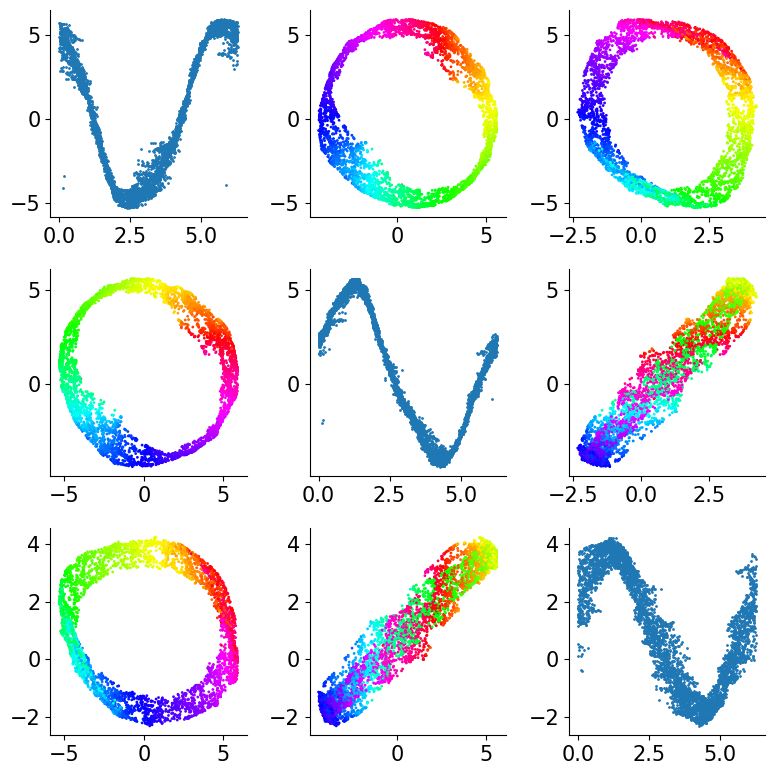

In [14]:
plt.figure(figsize=(8,8))
for i in range(ncomp):
  for j in range(ncomp):
    plt.subplot(ncomp,ncomp, j + ncomp*i + 1)
    if i == j:
      plt.scatter(dat['istim'], embed[:, i], s=1)
    else:
      plt.scatter(embed[:, j], embed[:, i], s=1, c=dat['istim'], cmap='hsv')
plt.show()

PCA

# Define all vars 

In [15]:
n_neurons, n_timepoints = acts.shape
mean_acts = np.mean(acts, axis=1)

angles  = dat['istim'] # in rads
# angles is in radians, that is from -pi,pi

delta_theta = ((np.diff(angles, prepend=angles[0]) + np.pi) % (2 * np.pi) - np.pi) # here we need to wrap [-pi,pi], as the change can be erroneous otherwise 

speed = dat['run'] #state var
acceleration = np.diff(speed) # rate var 
acceleration = np.insert(acceleration, 0, 0)

ratios = []
for i in range(1, len(angles)):
    current_angle = angles[i]
    previous_angle = angles[i-1]
    if previous_angle != 0:

        ratio = (current_angle - previous_angle)/ previous_angle #circular 
    else:
        ratio= np.nan
    
    ratios.append(ratio)

ratios = np.array(ratios)
ratios = np.insert(ratios, 0, np.mean(ratios))  # insert a mean value in beginnignt o maintain length consistency
ratios = np.abs(ratios) # negative in  
log_ratios = np.log(1+ratios) #logarithm or δθ/θ

# NMF

In [16]:
data_pos = np.abs(np.min(acts)) + acts
data_pos = np.array(data_pos)

In [17]:
n_components=40 # or load n_comps from cross-validation, n_components = elbow in test error curve 

# Run NMF with the optimal number of components
model = NMF(n_components=n_components, max_iter=1000, init='random', random_state=0, verbose=True, l1_ratio=0.5)
W = model.fit_transform(data_pos)
H = model.components_

violation: 1.0
violation: 0.8846044370416581
violation: 0.4775805707185559
violation: 0.34413708156757084
violation: 0.2756525288203749
violation: 0.2274165549498224
violation: 0.19108994237392238
violation: 0.1643354539271337
violation: 0.14452498355096127
violation: 0.12996079482080566
violation: 0.11859126932501242
violation: 0.10954979287623712
violation: 0.10211089240092718
violation: 0.09560233040365863
violation: 0.08957576079020652
violation: 0.08398508077254077
violation: 0.07872336586626186
violation: 0.07396047661703056
violation: 0.06959630567050751
violation: 0.06555359118738027
violation: 0.06169922298143943
violation: 0.05784167386873098
violation: 0.05403779766934597
violation: 0.05046518912862137
violation: 0.047184411695239584
violation: 0.0442685566944811
violation: 0.0417042764233835
violation: 0.039472901683294995
violation: 0.037613175956651784
violation: 0.03603971973050738
violation: 0.03472321486962847
violation: 0.0336275330767639
violation: 0.0327605152349746

## Plot NMFs- as a function of variables (scatters as above in PCA)

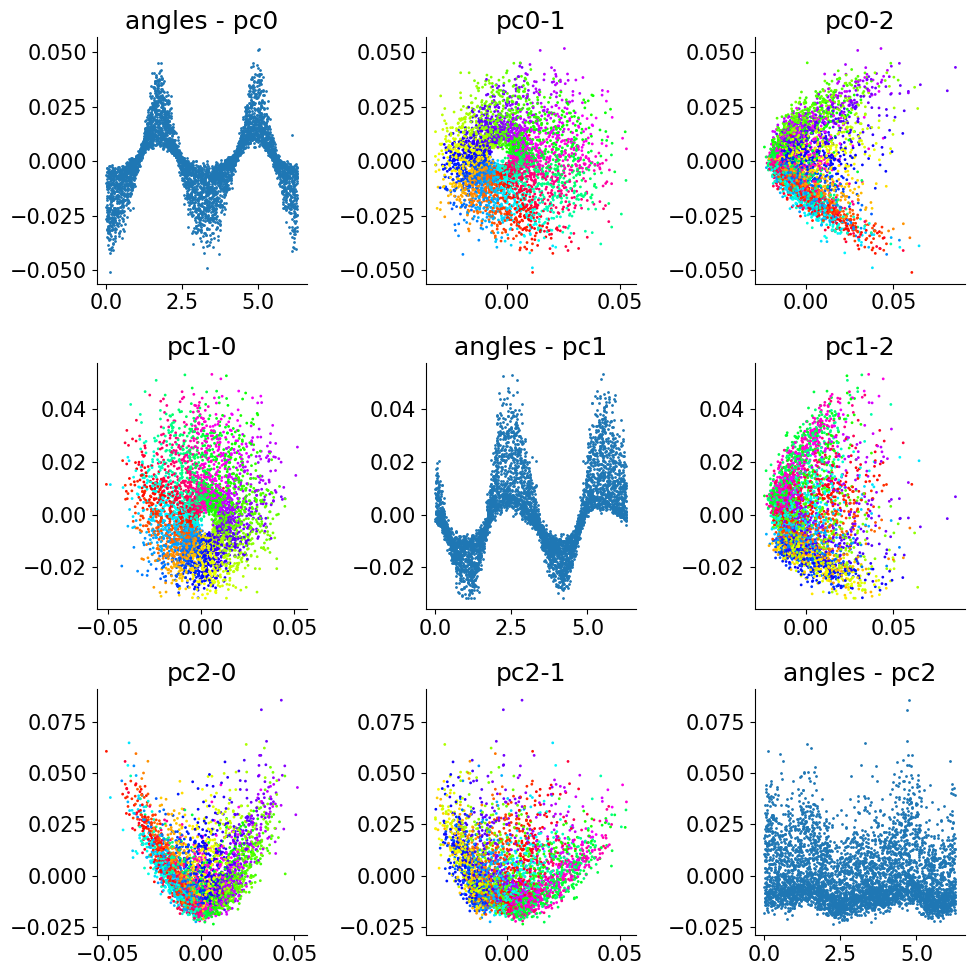

In [18]:
plt.figure(figsize=(10,10))
for i in range(ncomp):
  for j in range(ncomp):
    plt.subplot(ncomp,ncomp, j + ncomp*i + 1)
    if i == j:
      plt.title(f'angles - pc{i}')
      plt.scatter(dat['istim'], eigenvalues_t[i, :], s=1)
    else:
      plt.title(f'pc{i}-{j}')

      plt.scatter(eigenvalues_t[j, :], eigenvalues_t[i, :], s=1, c=dat['istim'], cmap='hsv')
plt.show()

# DimRed: UMAP (Fig. S1)

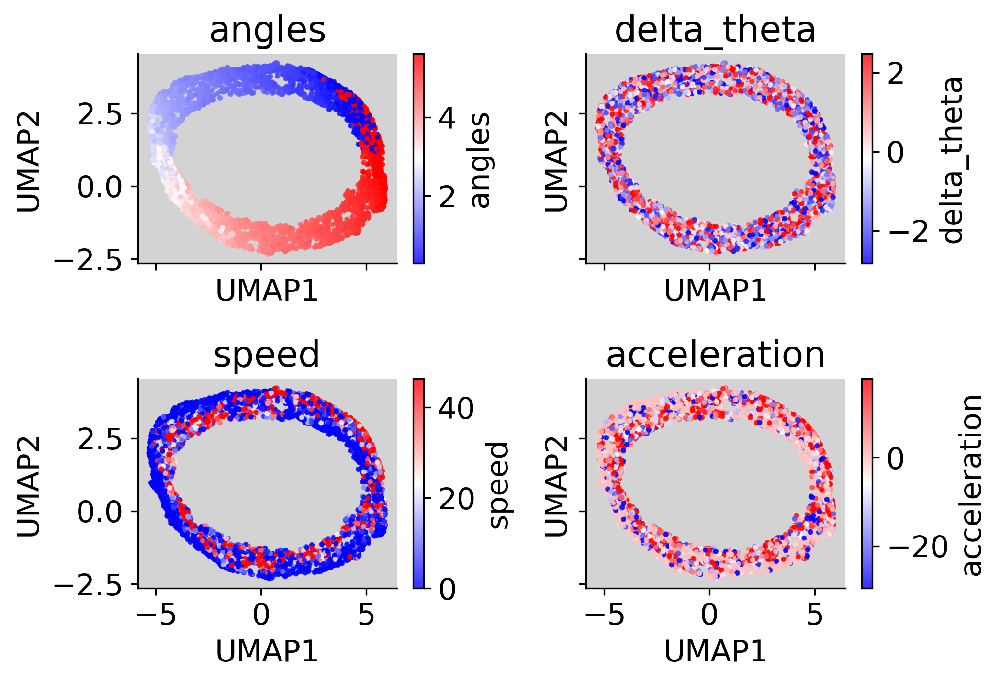

In [19]:
#subplots with umaps colorcoded as function of vars 
fig, axes = plt.subplots(2,2, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# titles and data mapping
titles = [
    "angles",
    "delta_theta",
    "speed",
    "acceleration"
    ]

data = [angles, delta_theta, speed, acceleration]
labels = ["angles", "delta_theta","speed", "acceleration"]

for i, ax in enumerate(axes.flat):
    sc = ax.scatter(umap1, umap3, c=data[i], cmap='bwr', s=3, alpha=0.8, vmin=np.percentile(data[i],5), vmax=np.percentile(data[i],90))
    ax.set_facecolor("lightgray")    
    ax.set_title(titles[i])
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label(labels[i])

plt.tight_layout()
plt.savefig("evoked_UMAP_all_vars_lighgray.png", dpi=300)
plt.savefig("evoked_UMAP_all_vars_lighgray.svg", dpi=300)

plt.show()


In [20]:
save_dir

WindowsPath('results/evoked_ds')

# PCA

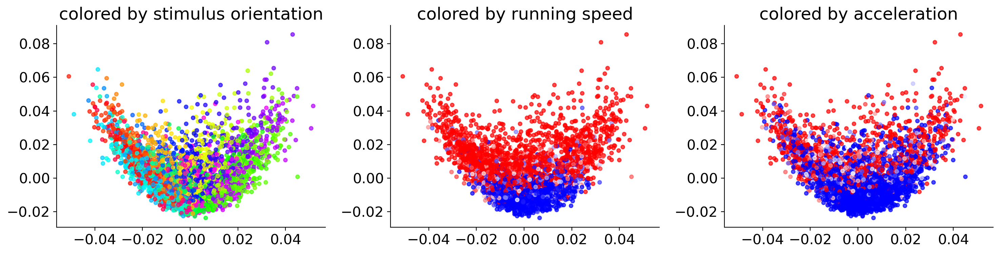

In [21]:
plt.figure(figsize=(15, 4), dpi=200)
plt.subplot(1, 3, 1)
plt.scatter(eigenvalues_t[0, :], eigenvalues_t[2, :], s=15, c=dat['istim'], cmap='hsv', alpha=0.7)
plt.title('colored by stimulus orientation')

plt.subplot(1, 3, 2)
plt.scatter(eigenvalues_t[0, :], eigenvalues_t[2, :], s=15, c=dat['run'], vmin=0, vmax=10, alpha=0.7, cmap='bwr')
plt.title('colored by running speed')

plt.subplot(1, 3, 3 )
plt.scatter(eigenvalues_t[0, :], eigenvalues_t[2, :], s=15, c=acceleration, vmin=0, vmax=10, alpha=0.7, cmap='bwr')
plt.title('colored by acceleration')
plt.savefig(save_dir /'pca_colorcoded_motion_vars.png')
plt.show()

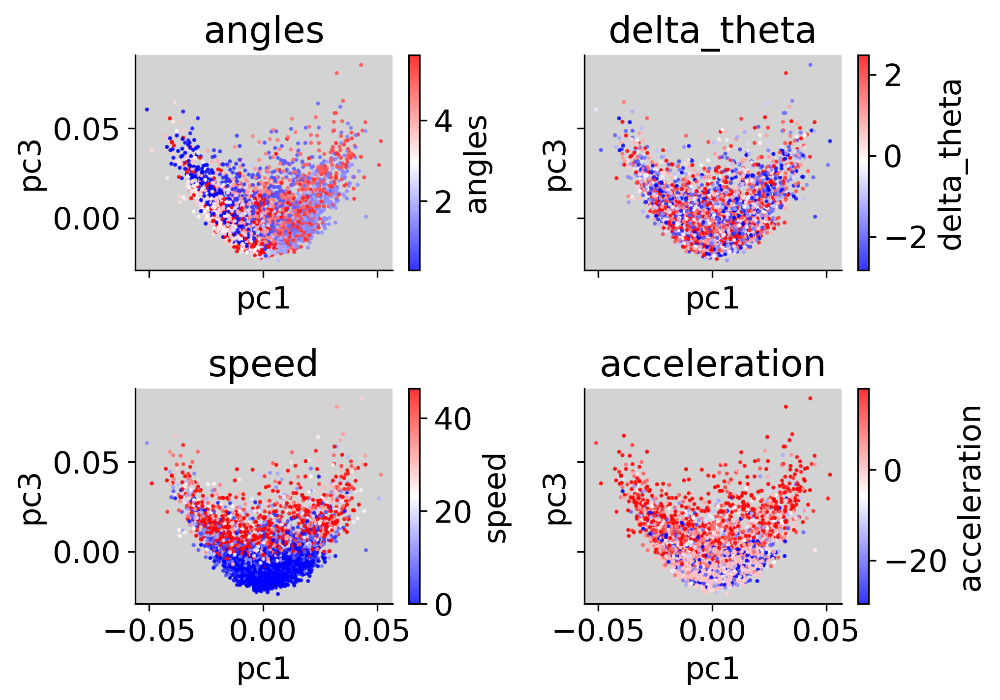

In [22]:
#subplots with umaps colorcoded as function of vars 
fig, axes = plt.subplots(2,2, figsize=(7, 5), sharex=True, sharey=True, dpi=300)

# titles and data mapping
titles = [
    "angles",
    "delta_theta",
    "speed",
    "acceleration"
    ]

data = [angles, delta_theta, speed, acceleration]
labels = ["angles", "delta_theta","speed", "acceleration"]

for i, ax in enumerate(axes.flat):
    sc = ax.scatter(eigenvalues_t[0,:], eigenvalues_t[2,:], c=data[i], cmap='bwr', s=1, alpha=0.8, vmin=np.percentile(data[i],5), vmax=np.percentile(data[i],90))
    ax.set_facecolor("lightgray")    
    ax.set_title(titles[i])
    ax.set_xlabel("pc1")
    ax.set_ylabel("pc3")
    cbar = fig.colorbar(sc, ax=ax)
    cbar.set_label(labels[i])

plt.tight_layout()
plt.savefig("evoked_PCA_all_vars_lighgray.png", dpi=300)
plt.savefig("evoked_PCA_all_vars_lighgray.svg", dpi=300)

plt.show()


# Scree plot and get no. of pcs exlpaining 95 % variance 

84


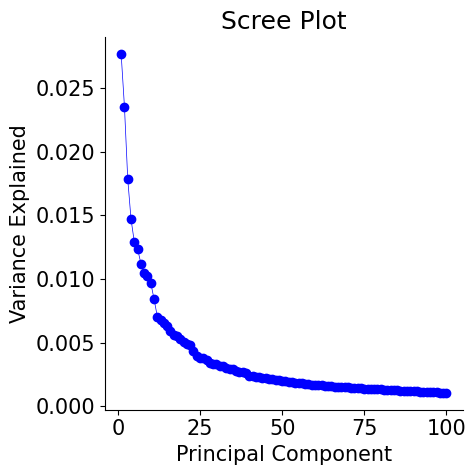

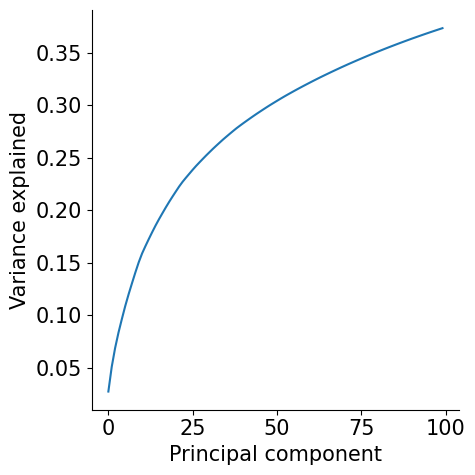

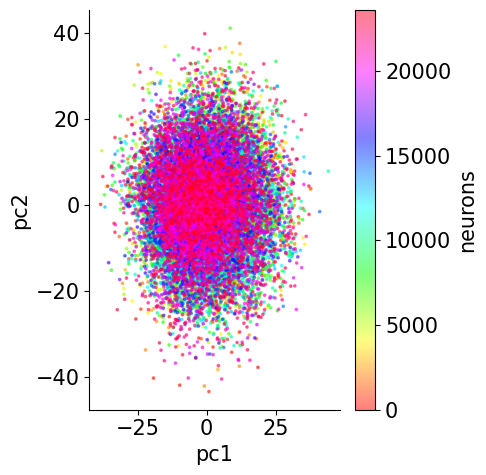

In [23]:
var_exp_t = np.sort(var_exp_t)[::-1]  
var_exp_cumsum = np.cumsum(var_exp_t) / np.sum(var_exp_t)  

# find the number of components explaining at least 95% variance
n_comps_95 = np.argmax(var_exp_cumsum >= 0.95) + 1
print(n_comps_95)

plt.figure(figsize=(5, 5), dpi=100)
PC_values = np.arange(len(eigenvalues_t)) + 1
plt.plot(PC_values[0:100], var_exp_t[0:100], 'o-', linewidth=0.5, color='blue')
plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

plt.figure(figsize=(5, 5))
plt.plot(np.cumsum(var_exp_t[0:200]))
plt.xlabel('Principal component')
plt.ylabel('Variance explained')
plt.show()

plt.figure(figsize=(5, 5))
plt.scatter(pc1_t, pc2_t, c=np.arange(len(pc1_t)), cmap='hsv', alpha=0.5, s=3)
plt.xlabel('pc1')
plt.ylabel('pc2')
plt.colorbar(label='neurons')
plt.show()

In [24]:
# no. of pcs needed to exlpain 95 % variance (to be used in Prediction)

eigenvalues_t_95_var = eigenvalues_t[:n_comps_95, :]

<!-- Setting & plotting derivatives -->

<!-- Plot all variables of interest -->

# Peri Change time histogram 

Define big change as around x degrees (with tolerance of 0.1 so that big_angle_change = [pi-e, pi + e]
Try 90, 180 and something small like 30

Steps: 

1. Compute the angle differences between consecutive time points (aka delta_theta)

2. Identify time points (t2) where the change is within [x - epsilon, x + epsilon] degrees. Epsilon is some jitter eg 5 or 10 °.

3. Extract peri-event data from -5 to +10 seconds relative to each t2.So for examle find all angle changes bewteen 85-95° and get the acts of neurons around those changes.

4. Aggregate and plot the histogram to visualize the average response (avg across all such changes)

In [25]:
# radians = degrees * np.pi/180
# degrees = radians * 180 / np.pi

# degrees =10
# radians = 10 *  np.pi/180

In [26]:
angles.max() #rads 

6.282404857491223

## Compute Per-chnage-time-histogram around a defined in absolute value change 

In [27]:
# this function gets you the indices of desired change and also gathers the activity of neurons around that change. It also plots the (average response) PMTH.

def compute_peri_change_time_hist(acts, angle_change, angle_min, angle_max, sorting, n_timepoints, pre_window, post_window, save_dir, title):
    event_inds = np.where((angle_change>=angle_min) & (angle_change<=angle_max))[0]   #to get t2 +1 or we want t1, in rads !
    
    window = pre_window + post_window
    data = []

    for ind in event_inds:
        start = ind - pre_window 
        end = ind + post_window
        if start >= 0 and end < n_timepoints:
            data.append(acts[:, start:end])

    if data:
        pmth = np.mean(np.array(data), axis=0)
        baseline = np.mean(pmth[:pre_window-2,:], axis=0)
        
        base_corrected_pmth = pmth - baseline

    plt.figure(figsize=(4, 7), dpi=200)
    plt.imshow(base_corrected_pmth[sorting], aspect='auto', cmap='viridis', extent=[-pre_window, post_window, 0, acts.shape[0]], vmin=-np.percentile(base_corrected_pmth,5), vmax=np.percentile(base_corrected_pmth,90)) #np.percentile(base_corrected_pmth,95)
    plt.axvline(x=0, color='black', linestyle='--')
    plt.colorbar(label='ats (z-scored)')
    plt.xlabel('Time (frames)')
    plt.ylabel('Neurons (pc1_sorted)')
    plt.title(f'Change: {title}')
    
    plt.savefig(save_dir / f'{title}')
    plt.show()

    return event_inds, base_corrected_pmth

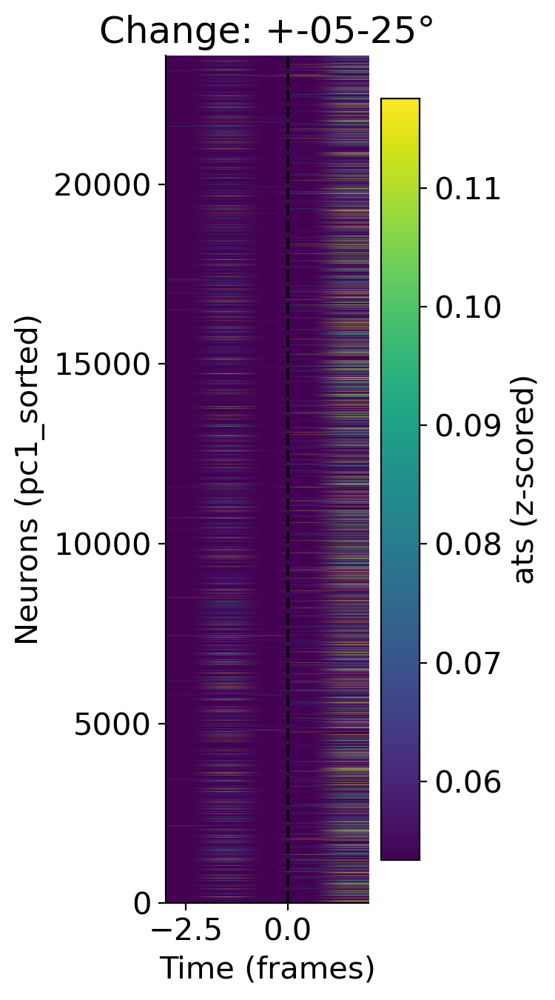

In [28]:
events_inds, base_corrected_pmth = compute_peri_change_time_hist(acts =acts, angle_change = np.abs(delta_theta), angle_min=0.08, angle_max=0.43, sorting=inds_pc1_sorted, n_timepoints=n_timepoints, pre_window=3, post_window=2, save_dir=save_dir, title= '+-05-25°')

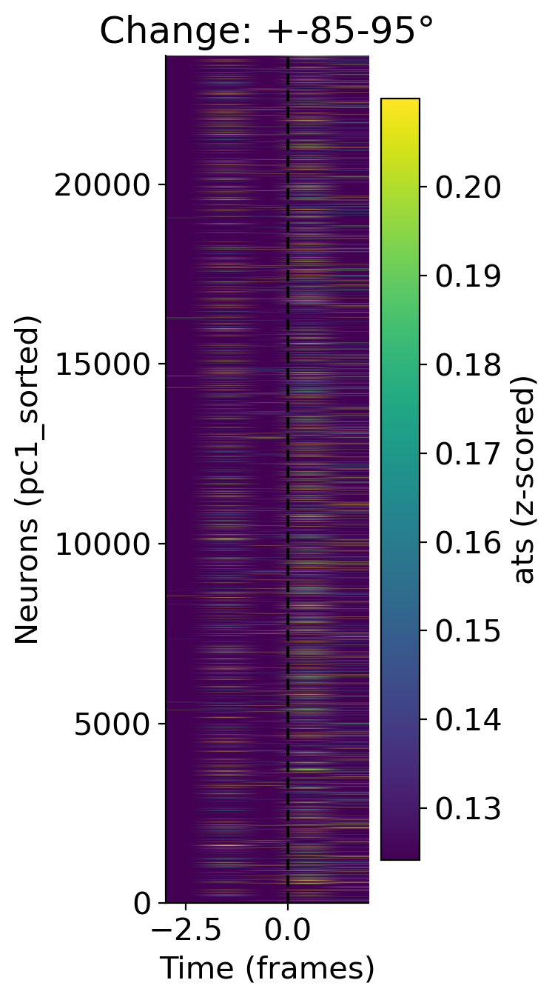

In [29]:
events_inds, base_corrected_pmth = compute_peri_change_time_hist(acts =acts, angle_change = np.abs(delta_theta), angle_min=1.38, angle_max=1.48, sorting=inds_pc1_sorted, n_timepoints=n_timepoints, pre_window=3, post_window=2, save_dir=save_dir, title= '+-85-95°')

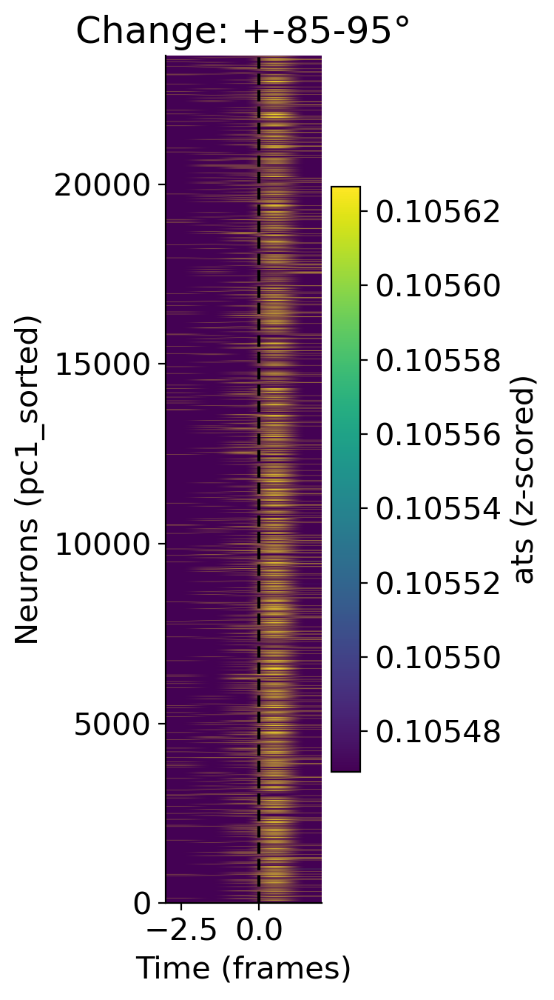

In [30]:
events_inds, base_corrected_pmth = compute_peri_change_time_hist(acts =acts, angle_change = np.abs(delta_theta), angle_min=1.48, angle_max=1.65, sorting=inds_pc1_sorted, n_timepoints=n_timepoints, pre_window=3, post_window=2, save_dir=save_dir, title= '+-85-95°')

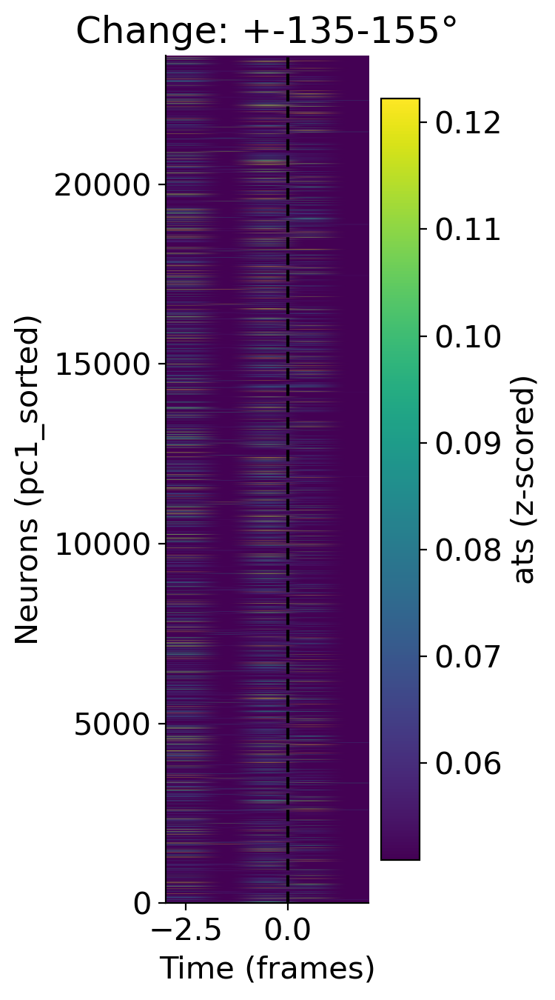

In [31]:
events_inds, base_corrected_pmth = compute_peri_change_time_hist(acts =acts, angle_change = np.abs(delta_theta), angle_min=2.35, angle_max=2.7, sorting=inds_pc1_sorted, n_timepoints=n_timepoints, pre_window=3, post_window=2, save_dir=save_dir, title= '+-135-155°')

## Plot big angles 85-95 onto the vars 

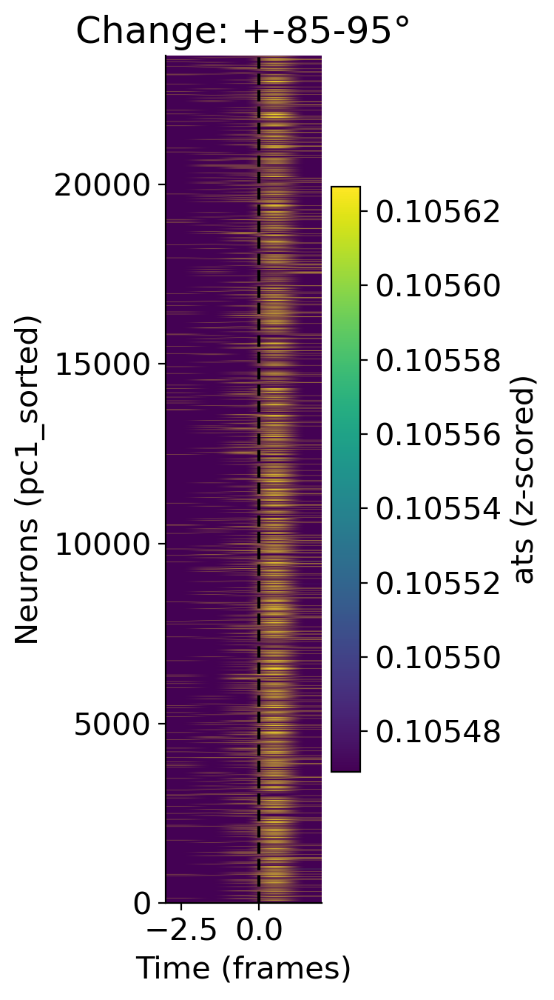

In [32]:
events_inds, base_corrected_pmth = compute_peri_change_time_hist(acts =acts, angle_change = np.abs(delta_theta), angle_min=1.48, angle_max=1.65, sorting=inds_pc1_sorted, n_timepoints=n_timepoints, pre_window=3, post_window=2, save_dir=save_dir, title= '+-85-95°')

In [33]:
# fig, axs = plt.subplots(8, 1, figsize=(15, 20), gridspec_kw={'height_ratios': [3, 1, 1, 1, 1, 1, 1, 1]})

# axs[0].imshow(acts_sorted, vmax=0.96, aspect='auto', cmap='binary')
# axs[0].set_ylabel('sorted neurons')
# axs[0].set_title('pc1')

# axs[1].plot(gaussian_filter1d(mean_acts, sigma=2))
# axs[1].scatter(events_inds, gaussian_filter1d(mean_acts, sigma=2)[events_inds], color='orange')
# axs[1].set_ylabel('mean_acts')
# axs[1].set_title('mean_acts')

# # Plot pupil_motion
# axs[2].plot(gaussian_filter1d(speed, sigma=2))
# axs[2].scatter(events_inds, gaussian_filter1d(speed, sigma=2)[events_inds], color='orange')
# axs[2].set_ylabel('speed')
# axs[2].set_title('speed')

# # Plot pupil_motion
# axs[3].plot(gaussian_filter1d(acceleration, sigma=2))
# axs[3].scatter(events_inds, gaussian_filter1d(acceleration, sigma=2)[events_inds], color='orange')

# axs[3].set_ylabel('acceleration')
# axs[3].set_title('acceleration')

# # Plot pupil_dilation
# axs[4].plot(gaussian_filter1d(angles, sigma=2))
# axs[4].scatter(events_inds, gaussian_filter1d(angles, sigma=2)[events_inds], color='orange')

# axs[4].set_ylabel('angles')
# axs[4].set_title('angles')

# # Plot acceleration
# axs[5].plot(gaussian_filter1d(delta_theta, sigma=2))
# axs[5].scatter(events_inds, gaussian_filter1d(delta_theta, sigma=2)[events_inds], color='orange')

# axs[5].set_ylabel('angles_change')
# axs[5].set_title('angles_change')

# plt.tight_layout()

# plt.savefig(save_dir / 'rmap_and_vars.png')  # Save the figure to the drive
# plt.show()

# Linear decoder 

In [34]:
from sklearn.preprocessing import StandardScaler

# Function to plot neuron traces and target variable
def plot_neurons_with_target(X, y, model, target_name, top_indices):
    fig, axs = plt.subplots(3,1, figsize=(30,15), dpi=200)
    # Standardize the data (neuron activity and target variable)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)  # Scale neuron activity (but that is norm, no?)
    y_scaled = scaler.fit_transform(y.reshape(-1, 1)).flatten()  # Scale target variable
    
    # Plot neuron traces
    
    for i, idx in enumerate(top_indices):
        axs[i].plot(gaussian_filter1d(X_scaled[:500, idx], sigma=1), label=f'Neuron {idx + 1}', c='b')

    # Plot the target variable in gray
        axs[i].plot(gaussian_filter1d(y_scaled[:500], sigma=1), color='grey', label='Target Variable')

        axs[i].set_title(f"Most predictive neurons: {target_name}")
        axs[i].set_xlabel('time (frames)')
        axs[i].set_ylabel('acts')
        axs[i].legend()
        plt.savefig(save_dir / 'lin_reg_most_pred_neurons.png')

# Function to get top 3 highest-weighted neurons and plot them with the target
def get_top_neurons_and_plot(X, y, model, target_name):
    # Get the absolute value of coefficients and sort them
    abs_coef = np.abs(model.coef_)
    top_indices = np.argsort(abs_coef)[::-1][:3]  # get inds of 3 most predictive neurons (for plotting)
    top_100_inds = np.argsort(abs_coef)[::-1][:100] #get 100 most predictive neurons (for computing iou=overlap)
    
    # Plot neuron traces with target variable
    plot_neurons_with_target(X, y, model, target_name, top_indices)
    
    return top_indices, abs_coef[top_indices], top_100_inds

#Github: linear_preds 

from pathlib import Path
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error, explained_variance_score, r2_score
from scipy.stats import pearsonr


def ridge_regression_(X, targets, alphas, chunk_data, fs, save_dir, train_ratio=0.8, val_ratio=0.1): #correct
    """
    Performs Ridge regression on chunked neuronal activity data, with manual alpha selection.

    Args:
        X (ndarray): Neuronal activity data (time x neurons).
        targets (dict): Dictionary of target variables {name: array (time,)}.
        alphas (list or ndarray): List of Ridge hyperparameter values.
        chunk_data (function): Function to chunk data.
        fs (int): Sampling rate.
        save_dir (str): Directory to save results.
        train_ratio (float): Ratio of data to be used for training (default = 0.8).
        val_ratio (float): Ratio of data for validation (default = 0.1).

    Returns:
        dict: Ridge regression results including weights, intercept, best alpha, and metrics.
    """

    # **Step 1: Chunk the Data**
    reshaped_X = chunk_data(X, sampling_rate=fs, chunk_duration=72)  
    reshaped_targets = {name: chunk_data(y, sampling_rate=fs, chunk_duration=72) for name, y in targets.items()}  

    num_chunks = reshaped_X.shape[0]  # Get total number of chunks

    # **Step 2: Define Train/Validation/Test Splits**
    test_ratio = 1 - train_ratio - val_ratio  # Ensure test set gets 10% by default
    num_train = int(train_ratio * num_chunks)
    num_val = int(val_ratio * num_chunks)
    num_test = num_chunks - num_train - num_val  # Ensure remaining 10% goes to test

    if num_test <= 0:
        raise ValueError("Not enough data for a test set. Reduce train/val ratio.")

    # **Step 3: Use TimeSeriesSplit Instead of Shuffling (Optional)**
    train_idx = np.arange(0, num_train)
    val_idx = np.arange(num_train, num_train + num_val)
    test_idx = np.arange(num_train + num_val, num_chunks)

    # **Step 4: Extract Train/Validation/Test Sets**
    X_train = reshaped_X[train_idx].reshape(-1, X.shape[1])
    X_val = reshaped_X[val_idx].reshape(-1, X.shape[1])
    X_test = reshaped_X[test_idx].reshape(-1, X.shape[1])

    ridge_regression_results = {}

    for target_name, y in reshaped_targets.items():
        y = np.nan_to_num(y)  # Ensure no NaNs
        y_train = y[train_idx].reshape(-1, 1)
        y_val = y[val_idx].reshape(-1, 1)
        y_test = y[test_idx].reshape(-1, 1)  # Final test set

        print(f'Target: {target_name}, Train Size: {X_train.shape}, Validation Size: {X_val.shape}, Test Size: {X_test.shape}')

        # **Step 5: Manually Select Best Alpha Using Validation Set**
        best_alpha = None
        best_r2 = -np.inf

        for alpha in alphas:
            model = Ridge(alpha=alpha)
            model.fit(X_train, y_train)
            y_val_pred = model.predict(X_val)
            r2_val = r2_score(y_val, y_val_pred)

            if r2_val > best_r2:
                best_r2 = r2_val
                best_alpha = alpha

        print(f"Target: {target_name}, Best Alpha from Validation: {best_alpha}")

        # **Step 6: Train Final Model with Best Alpha on Train Set**
        final_model = Ridge(alpha=best_alpha)
        final_model.fit(X_train, y_train)

        # **Step 7: Evaluate on the Untouched Test Set**
        y_test_pred = final_model.predict(X_test)

        # **Step 8: Store Results**
        ridge_regression_results[target_name] = {
            'weights': final_model.coef_.flatten().tolist(),
            'intercept': final_model.intercept_.tolist(),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
            'MSE': mean_squared_error(y_test, y_test_pred),
            'Pearson R': pearsonr(y_test.ravel(), y_test_pred.ravel())[0],  # Flatten properly
            'Explained Var': explained_variance_score(y_test, y_test_pred),
            'R²': r2_score(y_test, y_test_pred),
            'alpha': best_alpha,
            'y_val': y_val.flatten().tolist(),   # Store actual values
            'y_test_pred': y_test_pred.flatten().tolist(),  # Store predicted values
            'y_test': y_test
    
        }

        print(f"Target: {target_name}, Final Test R²: {ridge_regression_results[target_name]['R²']}")

        # **Step 9: Plot and Save Predictions**
        if 'plot_predictions' in globals():
            plot_predictions(y_test_pred, y_test, target_name, ridge_regression_results, save_dir)
        else:
            print(f"Warning: plot_predictions function not found. Skipping plotting for {target_name}.")

    return ridge_regression_results

def shuffled_control_regression(X, targets, alphas, num_iterations):
    """
    Performs shuffled control analysis for Ridge regression.
    """
    shuffled_metrics = {name: {'RMSE': [], 'MSE': [], 'Pearson R': [], 'Explained Var': [], 'R²': [], 'weights': []} for name in targets.keys()}
    
    for target_name, y in targets.items():
        for i in range(num_iterations):
            rnd_y = block_permutation(y, block_size=round(0.5 * len(y) / 10)) #half/10 #block shuffle to keep autocorrs 
            
            y = np.nan_to_num(y)

            # rnd_y = full_random_shuffling(y) 
            X_train, X_test, y_train, y_test = train_test_split(X, rnd_y, test_size=0.2, random_state=i)


            # rnd_y = chunk_data(rnd_y, sampling_rate=fs, chunk_duration=72)[shuffle_idx]
            
            y_train = y_train.reshape(-1, 1)
            y_test = y_test.reshape(-1, 1)
            
            model = RidgeCV(alphas=alphas)
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)
            
            shuffled_metrics[target_name]['RMSE'].append(np.sqrt(mean_squared_error(y_test, y_pred)))
            shuffled_metrics[target_name]['MSE'].append(mean_squared_error(y_test, y_pred))
            shuffled_metrics[target_name]['Pearson R'].append(pearsonr(y_test.flatten(), y_pred.flatten())[0])
            shuffled_metrics[target_name]['Explained Var'].append(explained_variance_score(y_test, y_pred))
            shuffled_metrics[target_name]['R²'].append(r2_score(y_test, y_pred))
            shuffled_metrics[target_name]['weights'].append(model.coef_) #to compare weights in shuffled vs real model 
    
    return shuffled_metrics



    #add to functions
# Block permutation function
def block_permutation(data, block_size):
    """ Shuffle data within fixed-size blocks. """
    permuted_data = np.copy(data)
    num_blocks = len(data) // block_size
    
    for i in range(num_blocks):
        start = i * block_size
        end = start + block_size
        np.random.shuffle(permuted_data[start:end])  # Shuffle each block
    
    return permuted_data

def full_random_shuffling(y):
    """ Shuffle all time points randomly without preserving any blocks. """
    return np.random.permutation(y)

# Reshape into chunks (for sequential, time-based chunking)
def chunk_data(data, sampling_rate, chunk_duration):

    chunk_size  = chunk_duration * sampling_rate # 72 s but why
    num_samples = len(data)
    num_chunks = num_samples // chunk_size
    if num_chunks == 0:
        raise ValueError(f"Not enough data to form full chunks of size {chunk_size}.")
    
    reshaped_data = data[:num_chunks * chunk_size].reshape(num_chunks, chunk_size, -1)  # Reshape into (num_chunks, chunk_size, features)
    return reshaped_data


# shuffle in chunks with continuous time 
def blocked_shuffle(num_chunks, num_blocks=5): # 80 - 20 %
    block_size = num_chunks // num_blocks
    block_indices = np.array_split(np.arange(num_chunks), num_blocks)
    
    for i in range(num_blocks):
        np.random.shuffle(block_indices[i])
    
    return np.concatenate(block_indices)

## Plotting functions

In [35]:
def plot_all_predictions(ridge_regression_results, save_dir=None):
    """
    Plots predicted vs. actual values for all target variables in subplots.

    Parameters:
    - ridge_regression_results (dict): Dictionary containing model results for each target.
    - save_dir (str, optional): Directory to save the figure. If None, only displays the plot.
    """
    num_targets = len(ridge_regression_results)
    fig, axes = plt.subplots(1, num_targets, figsize=(5 * num_targets, 5), dpi=300)

    if num_targets == 1:
        axes = [axes]  # Ensure axes is iterable for a single subplot

    for i, (target_name, results) in enumerate(ridge_regression_results.items()):
        y_test = results['y_test']
        y_pred = results['y_test_pred']

        ax = axes[i]
        ax.scatter(y_test, y_pred, alpha=0.6, edgecolors='k')
        ax.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', linewidth=1.5)  # Diagonal reference line

        ax.set_title(f"{target_name} (R²={results['R²']:.2f})")
        ax.set_xlabel("Actual")
        ax.set_ylabel("Predicted")
        ax.grid(True, linestyle="--", alpha=0.6)

    plt.tight_layout()

    if save_dir:
        plt.savefig(f"{save_dir}/ridge_predictions.png", dpi=300)
    plt.show()




def plot_all_predictions_smooth(ridge_regression_results, y_tests, y_preds, save_dir=None, sigma=0.5, num_frames=300):
    """
    Plots smoothed predicted vs. actual values for all target variables in subplots.

    Parameters:
    - ridge_regression_results (dict): Dictionary containing model results for each target.
    - y_tests (dict): Dictionary of actual values for each target.
    - y_preds (dict): Dictionary of predicted values for each target.
    - save_dir (str, optional): Directory to save the figure. If None, only displays the plot.
    - sigma (float, optional): Standard deviation for Gaussian smoothing.
    - num_frames (int, optional): Number of frames to display.
    """
    num_targets = len(ridge_regression_results)
    fig, axs = plt.subplots(num_targets, 1, figsize=(10, 4 * num_targets), dpi=300)

    if num_targets == 1:
        axs = [axs]  # Ensure axs is iterable for a single subplot

    for i, target_name in enumerate(ridge_regression_results.keys()):
        y_test = y_tests[target_name][:num_frames]
        y_pred = y_preds[target_name][:num_frames]

        smoothed_test = gaussian_filter1d(y_test, sigma=sigma)
        smoothed_pred = gaussian_filter1d(y_pred, sigma=sigma)

        axs[i].plot(smoothed_test, label="Original", alpha=0.7, linewidth=2, color='gray')
        axs[i].plot(smoothed_pred, label=f'Predicted R²: {ridge_regression_results[target_name]["R²"]:.2f}', alpha=0.35, linewidth=3, color='blue')

        axs[i].set_title(f"{target_name}", fontsize=20)
        axs[i].set_ylabel(f"{target_name}", fontsize=15)
        axs[i].legend(fontsize=12, loc='upper right')
        axs[i].tick_params(axis='both', labelsize=10)

        if i == len(ridge_regression_results) - 1:
            axs[i].set_xlabel("Time (frames)", fontsize=15)

    plt.tight_layout()

    if save_dir:
        plt.savefig(f"{save_dir}/ridge_single_neurons_predictions_subplots.png", dpi=300)
        plt.savefig(f"{save_dir}/ridge_single_neurons_predictions_subplots.svg", dpi=300)


    plt.show()


def compare_real_vs_shuffled(metrics, shuffled_metrics, targets, num_iterations, save_dir):

    metrics_labels = ['RMSE', 'MSE', 'Pearson R', 'Explained Var', 'R²']
    plt.figure(figsize=(15,7), dpi=300)
    
    for i, metric in enumerate(metrics_labels):
        plt.subplot(2, 3, i + 1)
        real_values = [metrics[target][metric] for target in targets.keys()]
        shuffled_values = [np.mean(shuffled_metrics[target][metric]) for target in targets.keys()]
        shuffled_sem = [np.std(shuffled_metrics[target][metric]) / np.sqrt(num_iterations) for target in targets.keys()]

        plt.bar(range(len(targets)), real_values, color='blue', alpha=0.7, label="Model")
        plt.bar(range(len(targets)), shuffled_values, color='red', alpha=0.5, label="Shuffled")
        plt.errorbar(range(len(targets)), shuffled_values, yerr=shuffled_sem, fmt='o', color='black', capsize=5)
        
        plt.scatter(range(len(targets)), real_values, color='blue')
        plt.scatter(range(len(targets)), shuffled_values, color='red')
        
        plt.xticks(range(len(targets)), list(targets.keys()), rotation=45, fontsize=8)
        plt.ylabel(metric)
        plt.title(f"{metric}", y=1.15)
        plt.legend(loc='upper right', fontsize=7)
        plt.axhline(y=0, linestyle='--', c='gray')

# Set different y-limits based on the metric
        if metric in ['RMSE', 'MSE']: #adapted for this specific variable 
            plt.ylim(-1, 15)
        else:
            plt.ylim(-1, 1)

    plt.tight_layout()
    plt.suptitle("model vs. shuffled Model", fontsize=16, y=1.05)
    plt.savefig(save_dir / 'ridge_regression_real_vs_shuffled.svg', format='svg', dpi=300)

    plt.show()        

def compare_real_vs_shuffled(metrics, shuffled_metrics, targets, num_iterations, save_dir):
    """
    Plots real vs shuffled model performance.
    """
    metrics_labels = ['RMSE', 'MSE', 'Pearson R', 'Explained Var', 'R²']
    plt.figure(figsize=(15, 5), dpi=300)
    
    for i, metric in enumerate(metrics_labels):
        plt.subplot(2, 3, i + 1)
        real_values = [metrics[target][metric] for target in targets.keys()]
        shuffled_values = [np.mean(shuffled_metrics[target][metric]) for target in targets.keys()]
        shuffled_sem = [np.std(shuffled_metrics[target][metric]) / np.sqrt(num_iterations) for target in targets.keys()]

        plt.bar(range(len(targets)), real_values, color='blue', alpha=0.7, label="Model")
        plt.bar(range(len(targets)), shuffled_values, color='red', alpha=0.5, label="Shuffled")
        plt.errorbar(range(len(targets)), shuffled_values, yerr=shuffled_sem, fmt='o', color='black', capsize=5)
        
        plt.scatter(range(len(targets)), real_values, color='blue')
        plt.scatter(range(len(targets)), shuffled_values, color='red')
        
        plt.xticks(range(len(targets)), list(targets.keys()), rotation=45, fontsize=8)
        plt.ylabel(metric)
        plt.title(f"{metric}", y=1.15)
        plt.legend(loc='upper right', fontsize=10)
        plt.ylim(-1, 10)
        plt.axhline(y=0, linestyle='--', c='gray')

    plt.tight_layout()
    plt.suptitle("model vs. shuffled Model", fontsize=16, y=1.05)
    plt.savefig(save_dir / 'ridge_regression_real_vs_shuffled.svg', format='svg')
    plt.show()

def plot_predictions(y_test, y_pred, target_name, metrics, save_dir):
    """
    Plots original vs. predicted values for Ridge regression.
    """
    fig, axs = plt.subplots(1, 2, figsize=(20, 5), gridspec_kw={'width_ratios': [4, 1]}, dpi=300)
    
    axs[0].plot(gaussian_filter1d(y_test[:300], sigma=0.5), label="original", alpha=0.7, linewidth=2, color='gray') #plot on test , recheck 
    axs[0].plot(gaussian_filter1d(y_pred[:300], sigma=0.5), label=f'predicted R²: {metrics[target_name]["R²"]:.2f}', alpha=0.35, linewidth=3, color='blue')
    axs[0].set_title(f"{target_name}", fontsize=35)
    axs[0].set_xlabel("Time (frames)", fontsize=25)
    axs[0].set_ylabel(f'{target_name}', fontsize=25)
    axs[0].legend(fontsize=15, loc='upper right')
    axs[0].tick_params(axis='both', labelsize=10)



    axs[1].scatter(y_test[:300], y_pred[:300], s=10, alpha=0.7)
    axs[1].set_title(f"{target_name}", fontsize=35)
    axs[1].set_xlabel("original", fontsize=25)
    axs[1].set_ylabel("predicted", fontsize=25)
    
    plt.savefig(save_dir / f'{target_name}_ridge_regression.png')
    plt.savefig(save_dir / f'{target_name}_ridge_regression.svg', format='svg')
    plt.tight_layout()
    plt.legend(loc='upper right', bbox_to_anchor=(1.12, 1))
    plt.show()

# Set target variables 

In [36]:
X = acts.T  # Neuronal activity (shape: time x neurons)

targets = {
    'speed': speed,
    'acceleration': acceleration,
    'delta_theta': delta_theta,
    'log_ratios' : log_ratios
}

alphas = [0.0001, 0.001, 0.1, 1, 10, 100, 1000, 1500, 5000, 7000, 10000, 150000] 
num_iterations = 3 # def iterations for shuffled model 

## Run Regression

Target: speed, Train Size: (3456, 23589), Validation Size: (432, 23589), Test Size: (576, 23589)
Target: speed, Best Alpha from Validation: 0.0001
Target: speed, Final Test R²: 0.8048472859956541


C:\Users\zaggila\AppData\Local\Temp\ipykernel_3160\2529217492.py:175: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', bbox_to_anchor=(1.12, 1))


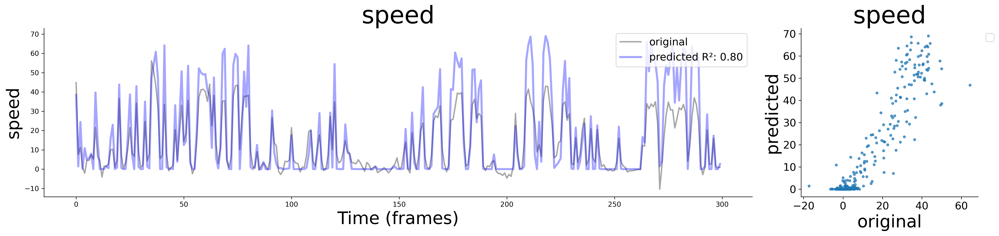

Target: acceleration, Train Size: (3456, 23589), Validation Size: (432, 23589), Test Size: (576, 23589)
Target: acceleration, Best Alpha from Validation: 100
Target: acceleration, Final Test R²: 0.6313342060456665


C:\Users\zaggila\AppData\Local\Temp\ipykernel_3160\2529217492.py:175: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', bbox_to_anchor=(1.12, 1))


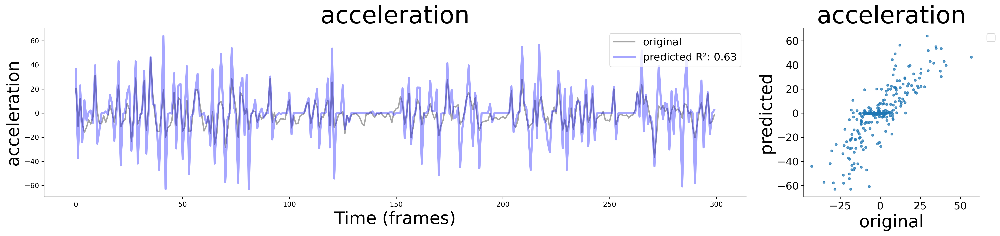

Target: delta_theta, Train Size: (3456, 23589), Validation Size: (432, 23589), Test Size: (576, 23589)
Target: delta_theta, Best Alpha from Validation: 10000
Target: delta_theta, Final Test R²: 0.04898736007840854


C:\Users\zaggila\AppData\Local\Temp\ipykernel_3160\2529217492.py:175: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', bbox_to_anchor=(1.12, 1))


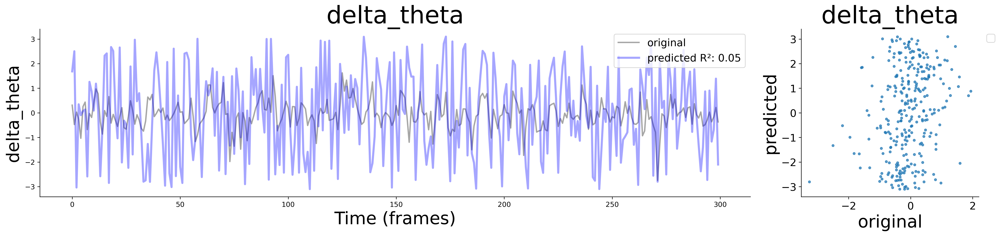

Target: log_ratios, Train Size: (3456, 23589), Validation Size: (432, 23589), Test Size: (576, 23589)
Target: log_ratios, Best Alpha from Validation: 10000
Target: log_ratios, Final Test R²: 0.14963636389076362


C:\Users\zaggila\AppData\Local\Temp\ipykernel_3160\2529217492.py:175: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right', bbox_to_anchor=(1.12, 1))


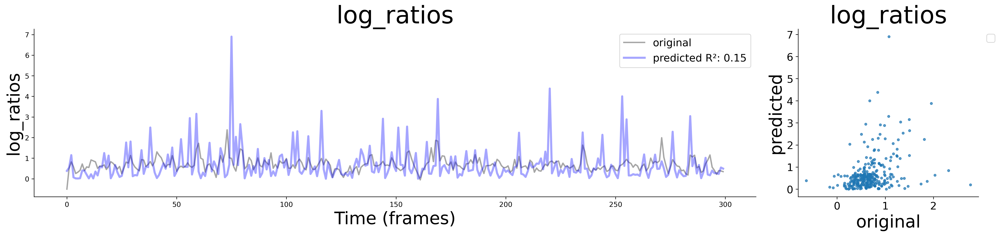

In [37]:
# run ridge regression 
ridge_regression_results_single_inputs = ridge_regression_(X, targets, alphas, chunk_data, fs, save_dir) #train_ratio=0.8, val_ratio=0.1

# Run shuffled regression (rnd y shift)
shuffled_regression_results_single_inputs = shuffled_control_regression(X, targets, alphas, num_iterations)

## Compare model with shuffle model (where the variable has been shuffled and no longer corresponds to time-wise activity mapping)

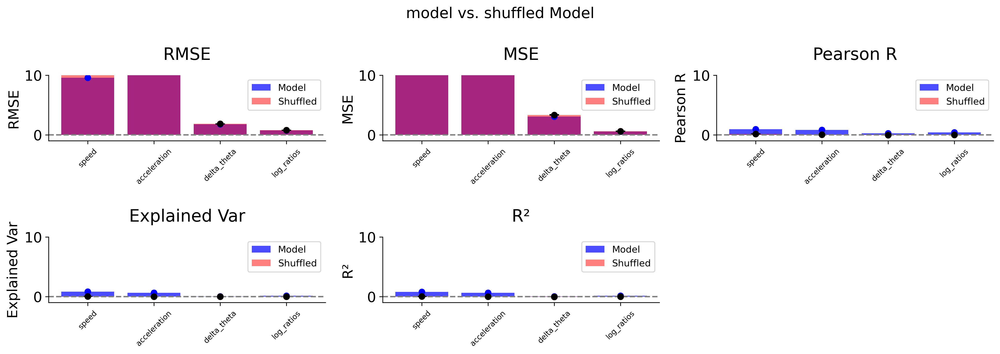

In [41]:
# Compare real vs. shuffled results #adjust ylims and ask jason about norm / 
compare_real_vs_shuffled(metrics=ridge_regression_results_single_inputs, shuffled_metrics=shuffled_regression_results_single_inputs,
                         targets=targets, num_iterations=num_iterations, save_dir=save_dir) #careful ridge results is the output no ridge_regression_results (adjust with metrics)

In [ ]:
# plot_all_predictions_smooth(ridge_regression_results_single_inputs, y_tests, y_preds, save_dir=save_dir) #plots all preds in subplots 

## Save dictionaries from acts input (load in next run)

In [ ]:
ridge_outputs_dir_sponts_ds = os.path.join(save_dir, "ridge_outputs_dir_evoked_ds")

np.save(os.path.join(save_dir, 'evoked_ridge_regression_results_single_inputs.npy'), ridge_regression_results_single_inputs)
np.save(os.path.join(save_dir, 'evoked_shuffled_regression_results_single_inputs.npy'), shuffled_regression_results_single_inputs)


# Mixed-selectivity analysis

Plot scatter pairplots of the model weights for each neuron and compute spearman correlation amongst them

In [ ]:
# example get weights from prediction of speed or acceleration (state and rate var)

speed_shuffled_weights = np.mean(shuffled_regression_results_single_inputs['speed']['weights'], axis=0)#for each iteration
speed_real_weights = ridge_regression_results_single_inputs['speed']['weights'] 

KS Statistic: 0.33875959133494427
P-value: 0.0
The distributions are significantly different (p < 0.05).


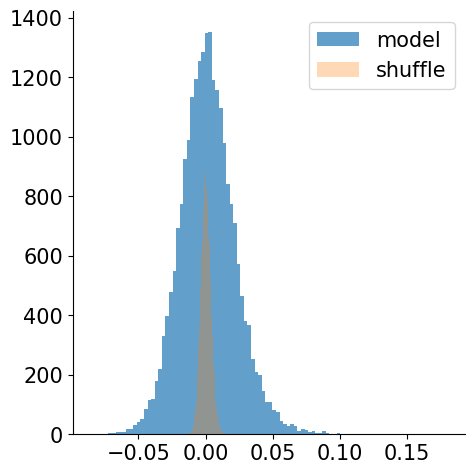

In [ ]:
from scipy.stats import ks_2samp # ks stats on the distributions 

plt.figure(figsize=(5,5), dpi=100)
plt.hist(speed_real_weights, label='model', alpha=0.7, bins=100)
plt.hist(speed_shuffled_weights, label='shuffle', alpha=0.3, bins=100)

plt.legend()

ks_statistic, p_value = ks_2samp(speed_real_weights, speed_shuffled_weights)

print(f"KS Statistic: {ks_statistic}")
print(f"P-value: {p_value}")

# Interpret the result
if p_value < 0.05:
    print("The distributions are significantly different (p < 0.05).")
else:
    print("The distributions are not significantly different (p >= 0.05).")
plt.show()

# Pairplots comparing neuron weights for each model (Fig. S5)

Pairplot for Real Weights


<Figure size 6000x1200 with 0 Axes>

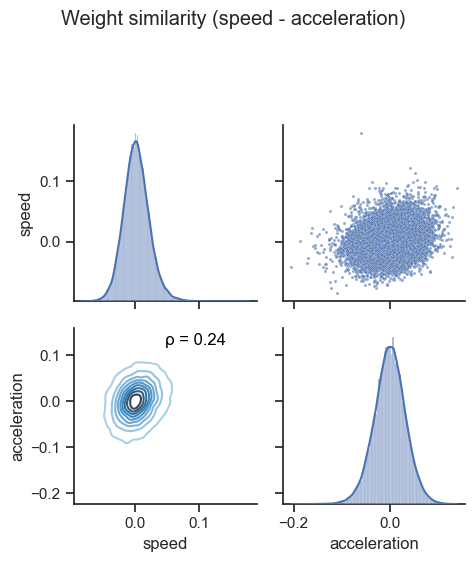

In [ ]:
speed_significant_inds = ridge_regression_results_single_inputs['speed']['weights'] 
acceleration_significant_inds = ridge_regression_results_single_inputs['acceleration']['weights'] 

# Create a DataFrame for real weights
real_weights_df = pd.DataFrame({
    'speed': speed_significant_inds,
    'acceleration': acceleration_significant_inds,
    # 'delta_theta': delta_theta_real_weights # to add istim for circ reg 
})

# Function to add Spearman correlation to the plots
def plot_spearman_corr(x, y, **kwargs):
    corr, _ = spearmanr(x, y)
    ax = plt.gca()
    ax.annotate(f'ρ = {corr:.2f}', xy=(0.5, 0.9), xycoords=ax.transAxes, fontsize=12, color='black')

print("Pairplot for Real Weights")
sns.set(style="ticks")
plt.figure(dpi=300)
g = sns.PairGrid(real_weights_df)
g.map_upper(sns.scatterplot, alpha=0.6, s=5)  # scatter plots in the upper triangle
g.map_lower(sns.kdeplot, cmap="Blues_d")  # KDE plots in the lower triangle
g.map_diag(sns.histplot, kde=True)  # histograms on the diagonal
g.map_lower(plot_spearman_corr)  # add Spearman correlation to the lower triangle
g.fig.suptitle("Weight similarity (speed - acceleration)", y=1.12)
plt.savefig(save_dir / 'evoked_ds_weights_spearman_sns.png')
plt.savefig(save_dir / 'evoked_ds_weights_spearman_sns.svg', format='svg')

plt.tight_layout()
plt.show() #we dot know what pecentage of cells have sig high weight 

# # Select neurons with significant weight in each decoder (fig.S5) 

In [98]:
def get_significant_weights(real_weights, shuffled_weights, alpha=0.01):
    """
    Identify significant most significant/most predictive neurons by comparing real weight distribution to shuffled one
    """
    # lower_bound = min(shuffled_weights)
    # upper_bound = max(shuffled_weights)

    lower_bound = np.percentile(shuffled_weights, alpha * 100 / 2)
    upper_bound = np.percentile(shuffled_weights, 100 - (alpha * 100 / 2))
    
    # get neurons where real weights fall outside the shuffled weights
    significant_indices = np.where((real_weights < lower_bound) | (real_weights > upper_bound))[0]
    
    return significant_indices

# Mixed-selectivity (Visualisation-Venn plots) (fig S5)

10857


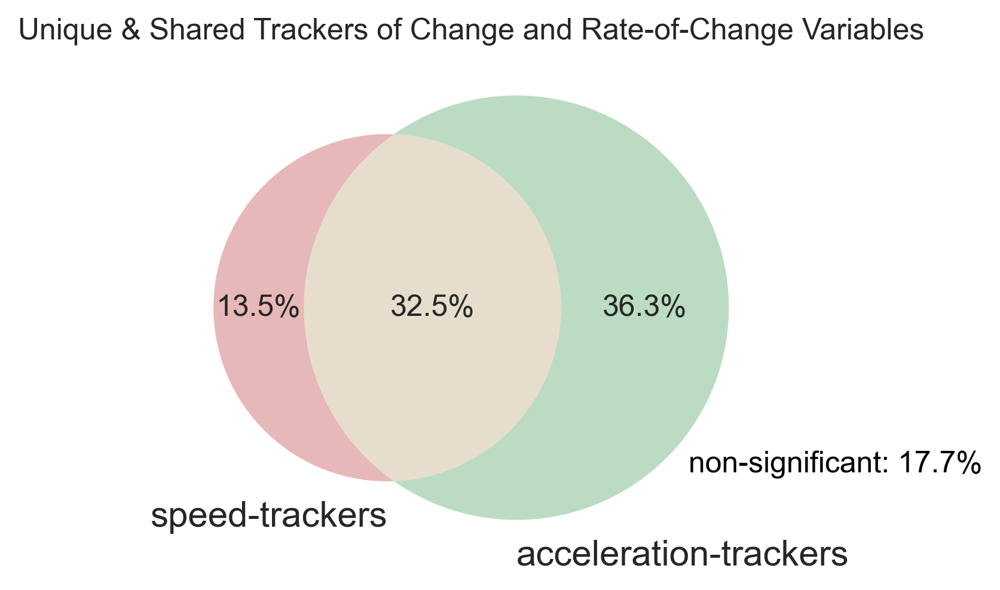

In [ ]:
# Extract significant neuron indices per target variable
speed_significant_indices = get_significant_weights(
    ridge_regression_results_single_inputs['speed']['weights'], shuffled_regression_results_single_inputs['speed']['weights'][2]
)
acceleration_significant_indices = get_significant_weights(
    ridge_regression_results_single_inputs['acceleration']['weights'], shuffled_regression_results_single_inputs['acceleration']['weights'][1]
)

# sets 
speed_set = set(speed_significant_indices)

print(len(speed_set))
acceleration_set = set(acceleration_significant_indices)

# compute unique/shared counts
only_speed = len(speed_set - acceleration_set)
only_acceleration = len(acceleration_set - speed_set)
shared = len(speed_set & acceleration_set)

# # compute unique significant neurons
# total_significant = len(speed_set | acceleration_set)

# Compute total neurons
total_neurons = n_neurons # all neurons --> express % relative to all neurons imaged 

# compute percentages
only_speed_pct = (only_speed / total_neurons) * 100
only_acceleration_pct = (only_acceleration / total_neurons) * 100
shared_pct = (shared / total_neurons) * 100
remaining_pct = 100 - (only_speed_pct + only_acceleration_pct + shared_pct)

# plot venn diagram
plt.figure(figsize=(5, 5), dpi=300)
venn = venn2([speed_set, acceleration_set], ('speed-trackers', 'acceleration-trackers'))

# Update labels with %
if venn.get_label_by_id('10'):
    venn.get_label_by_id('10').set_text(f"{only_speed_pct:.1f}%")
if venn.get_label_by_id('01'):
    venn.get_label_by_id('01').set_text(f"{only_acceleration_pct:.1f}%")
if venn.get_label_by_id('11'):
    venn.get_label_by_id('11').set_text(f"{shared_pct:.1f}%")

# add % for non-significant neurons outside the diagram 
plt.text(0.9, -0.4, f"non-significant: {remaining_pct:.1f}%", fontsize=12, ha='center', color='black')

plt.title("Unique & Shared Trackers of Change and Rate-of-Change Variables")

plt.savefig(save_dir / 'evoked_venn_plot_most_sign_neurons_unique_mixed_encoding.png')
plt.savefig(save_dir / 'evoked_speed_acc_venn_plot_most_sign_neurons_unique_mixed_encoding.svg', format='svg')

plt.show()

# Multi-input decoder (input is either acts, pcs, nmfs-> comparison of R2)
For fig. F: comparing R2 prediction from all_neurons, PCs or NMF superneurons

In [ ]:
def ridge_regression_all_inputs(multi_X, targets, alphas, chunk_data, fs, save_dir, train_ratio=0.8, val_ratio=0.1):
    """
    Performs Ridge regression on multiple chunked neuronal activity data with manual alpha selection.
    Saves results and generates R² comparison plots.
    
    Args:
        multi_X (dict): Dictionary of input types {input_name: ndarray (time x neurons)}.
        targets (dict): Dictionary of target variables {name: array (time,)}.
        alphas (list or ndarray): List of Ridge hyperparameter values.
        chunk_data (function): Function to chunk data.
        fs (int): Sampling rate.
        save_dir (Path): Directory to save results and plots.
        train_ratio (float): Ratio of data to be used for training (default = 0.8).
        val_ratio (float): Ratio of data for validation (default = 0.1).
    
    Returns:
        dict: Ridge regression results for each input type including weights, intercept, best alpha, and metrics.
    """
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    
    all_results = {}
    
    for input_name, X in multi_X.items():
        reshaped_X = chunk_data(X, sampling_rate=fs, chunk_duration=72)  
        reshaped_targets = {name: chunk_data(y, sampling_rate=fs, chunk_duration=72) for name, y in targets.items()}  
        
        num_chunks = reshaped_X.shape[0]  
        test_ratio = 1 - train_ratio - val_ratio
        num_train = int(train_ratio * num_chunks)
        num_val = int(val_ratio * num_chunks)
        num_test = num_chunks - num_train - num_val  
        
        if num_test <= 0:
            raise ValueError("Not enough data for a test set. Reduce train/val ratio.")
        
        train_idx = np.arange(0, num_train)
        val_idx = np.arange(num_train, num_train + num_val)
        test_idx = np.arange(num_train + num_val, num_chunks)
        
        X_train = reshaped_X[train_idx].reshape(-1, X.shape[1])
        X_val = reshaped_X[val_idx].reshape(-1, X.shape[1])
        X_test = reshaped_X[test_idx].reshape(-1, X.shape[1])
        
        ridge_regression_results = {}
        
        for target_name, y in reshaped_targets.items():
            y = np.nan_to_num(y)
            y_train = y[train_idx].reshape(-1, 1)
            y_val = y[val_idx].reshape(-1, 1)
            y_test = y[test_idx].reshape(-1, 1)
            
            best_alpha = None
            best_r2 = -np.inf
            
            for alpha in alphas:
                model = Ridge(alpha=alpha)
                model.fit(X_train, y_train)
                y_val_pred = model.predict(X_val)
                r2_val = r2_score(y_val, y_val_pred)
                
                if r2_val > best_r2:
                    best_r2 = r2_val
                    best_alpha = alpha
            
            final_model = Ridge(alpha=best_alpha)
            final_model.fit(X_train, y_train)
            y_test_pred = final_model.predict(X_test)
            
            ridge_regression_results[target_name] = {
                'weights': final_model.coef_.flatten().tolist(),
                'intercept': final_model.intercept_.tolist(),
                'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
                'MSE': mean_squared_error(y_test, y_test_pred),
                'R²': r2_score(y_test, y_test_pred),
                'alpha': best_alpha
            }
        
        all_results[input_name] = ridge_regression_results
    
    # Save results
    with open(save_dir / "ridge_results.pkl", "wb") as f:
        pickle.dump(all_results, f)

    
    return all_results

def plot_predictions(y_test, y_pred, target_name, metrics, save_dir):
    """
    Plots original vs. predicted values for Ridge regression.
    """
    fig, axs = plt.subplots(1, 2, figsize=(20, 5), gridspec_kw={'width_ratios': [4, 1]}, dpi=300)
    
    axs[0].plot(gaussian_filter1d(y_test[:300], sigma=1.5), label="original", alpha=0.7, linewidth=3, color='gray') 
    axs[0].plot(gaussian_filter1d(y_pred[:300], sigma=0.5), label=f'predicted R²: {metrics[target_name]["R²"]:.2f}', alpha=0.8, linewidth=2, color='blue')
    axs[0].set_title(f"{target_name}", fontsize=35)
    axs[0].set_xlabel("Time (frames)", fontsize=25)
    axs[0].set_ylabel(f'{target_name}', fontsize=25)
    axs[0].legend(fontsize=15, loc='upper right')
    axs[0].tick_params(axis='both', labelsize=10)

    axs[1].scatter(y_test[:300], y_pred[:300], s=10, alpha=0.7)
    axs[1].set_title(f"{target_name}", fontsize=35)
    axs[1].set_xlabel("original", fontsize=25)
    axs[1].set_ylabel("predicted", fontsize=25)
    
    plt.savefig(save_dir / f'{target_name}_ridge_regression.png')
    plt.tight_layout()
    plt.show()

def plot_most_predictive_neurons(X_test, top_neurons, input_type, target_name, save_dir):
    """
    Plots the most predictive neuron traces for a specific input and target.
    """
    fig, axs = plt.subplots(len(top_neurons), 1, figsize=(30, 15), sharex=True, dpi=200)

    for i, neuron in enumerate(top_neurons):
        axs[i].plot(X_test[:1000, neuron], color='orange', alpha=0.7)
        axs[i].set_title(f"neuron {neuron}", fontsize=12)
        axs[i].set_ylabel("acts")
        
    axs[-1].set_xlabel("Time (frames)")
    plt.suptitle(f"High weight neuron - {input_type} -> {target_name}", fontsize=14)
    plt.tight_layout()
    plt.savefig(save_dir / f'{input_type}_high_weight_neurons_{target_name}.png')
    plt.show()

def plot_r2_comparison(metrics, targets, save_dir):
    """
    Plots R² comparison for all inputs.
    """
    plt.figure(figsize=(15, 5), dpi=300)
    
    for i, target_name in enumerate(targets.keys()):
        plt.subplot(1, len(targets), i + 1)
        
        r2_values = [np.mean(metrics[input_type][target_name]['R²']) for input_type in metrics.keys()]
        plt.bar(metrics.keys(), r2_values, color=['blue', 'lightskyblue', 'lightsteelblue'])
        plt.title(f"{target_name}")
        plt.ylabel("R²")
        plt.ylim(0, 1)

    plt.tight_layout()
    plt.savefig(save_dir / 'r2_comparison_temporal_carsen_cv.png')
    plt.show()

    def plot_neurons_with_target(X, y, target_name, top_indices, save_path):
    fig, axs = plt.subplots(len(top_indices), 1, figsize=(30, 5 * len(top_indices)), dpi=200)
    
    # Ensure axs is an iterable even if there's only one subplot
    if len(top_indices) == 1:
        axs = [axs]
        
    # ✅ Plot each neuron's activity
    for i, idx in enumerate(top_indices):
        axs[i].plot(minmax_scale(X[idx, :900].reshape(-1, 1)), label=f'Neuron {idx + 1}', c='b', linewidth=3, alpha=0.6)
        axs[i].plot(minmax_scale(y[:900].reshape(-1, 1)), color='grey', alpha=0.5, label='Target', linewidth=4)

        axs[i].set_title(f"Most Predictive Neurons: {target_name}", fontsize=20)
        axs[i].set_xlabel("Time (frames)", fontsize=15)
        axs[i].set_ylabel("Activity", fontsize=15)
        axs[i].tick_params(axis="both", labelsize=10)
        axs[i].legend()

    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

def get_top_neurons_and_plot(X, y, model, target_name, save_dir, top_n=3, top_n_for_overlap=100):
    abs_coef = np.abs(model.coef_).flatten()  # Ensure it's a 1D array

    top_indices = np.argsort(abs_coef)[::-1][:top_n]  # Top N neurons for plotting
    top_100_inds = np.argsort(abs_coef)[::-1][:top_n_for_overlap]  # Top 100 for overlap calculations
    
    # ✅ Plot neuron traces with target variable
    save_path = save_dir / f"lin_reg_most_pred_neurons_{target_name}.png"
    plot_neurons_with_target(X, y, target_name, top_indices, save_path)
    
    return top_indices, abs_coef, abs_coef[top_indices], top_100_inds

# Multi inputs  --> Run regression using single neurons (as before) / PCs or NMFs

Gather performance metrices and compare across runs

In [ ]:
# all inputs (single neurons, PCs or NMFs (aka superneurons))
inputs = {
'acts' : acts.T, #z-scored acts, shape: time, neurons 
'PCs': eigenvalues_t_95_var.T, # no. of PCs acc for 95% var, shape: time, PCs
'temporal_nmfs': H.T, # temporal component of NMF, shape: time, NMFs 

}

targets = {
    'speed': speed,
    'acceleration': acceleration,
    'delta_theta (Δθ)': delta_theta
}

In [ ]:
H.T.shape

(4598, 40)

In [ ]:
# Function to check and handle NaN values
def handle_nan(y):
    if np.any(np.isnan(y)):
        print("NaN values found in target variable. Handling NaN values.")
        # Option 1: Remove rows with NaN values (you might also need to handle corresponding X)
        # y = y[~np.isnan(y)]
        # X = X[~np.isnan(y)]  # Ensure X matches y after removing

        # Option 2: Impute NaN values (e.g., using the mean)
        mean_value = np.nanmean(y)
        y = np.where(np.isnan(y), mean_value, y)
        
    return y

# Run multi inputs - save all in results dict and plot 

In [ ]:
import pickle

all_results = ridge_regression_all_inputs(inputs, targets, alphas, chunk_data, fs, save_dir)

KeyError: 'delta_theta'

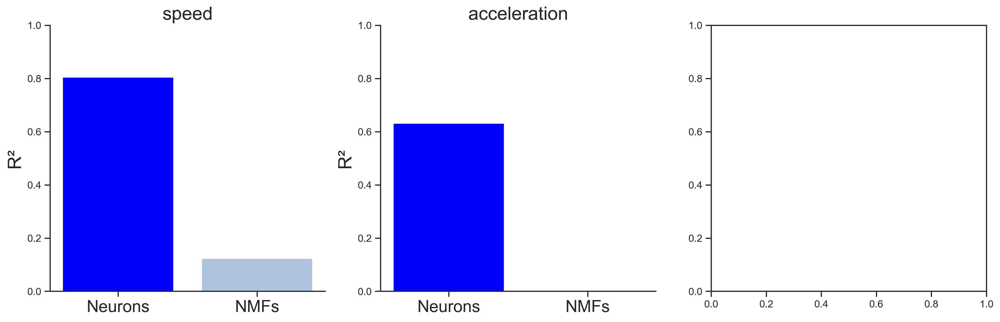

In [ ]:
def plot_r2_comparison(all_results, targets, save_dir, include_pcs=False):
    plt.figure(figsize=(20, 5), dpi=300)

    for i, target_name in enumerate(targets.keys()):
        plt.subplot(1, len(targets), i + 1)

        r2_acts = np.mean(all_results['acts'][target_name]['R²'])
        r2_temporal_nmfs = np.mean(all_results['temporal_nmfs'][target_name]['R²'])

        labels = ['Neurons', 'NMFs']
        values = [r2_acts, r2_temporal_nmfs]
        colors = ['blue', 'lightsteelblue']

        if include_pcs:
            r2_pcs = np.mean(all_results['PCs'][target_name]['R²'])
            labels.insert(1, 'PCs')
            values.insert(1, r2_pcs)
            colors.insert(1, 'lightskyblue')

        plt.bar(labels, values, color=colors)
        plt.title(f"{target_name}", fontsize=20)
        plt.ylabel("R²", fontsize=20)
        plt.ylim(0, 1)
        plt.xticks(fontsize=18)

        # Remove top and right spines for aesthetics
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)

    plt.tight_layout()

    # Define file names dynamically
    filename_base = "r2_comparison_with_pcs" if include_pcs else "r2_comparison"
    
    plt.savefig(save_dir / f"{filename_base}.png")
    plt.savefig(save_dir / f"{filename_base}.svg", format='svg', dpi=300)
    plt.show()

# Call function for both cases
plot_r2_comparison(all_results, targets, save_dir, include_pcs=False)
plot_r2_comparison(all_results, targets, save_dir, include_pcs=True)

# Circular Regression (for angles)

Adapted from here : https://gist.github.com/ahwillia/2941fb64e8bfe999c66291257601dfb4

In [40]:
acts.shape

(23589, 4598)

In [44]:
import scipy.stats
normcdf = scipy.stats.norm.cdf
normpdf = scipy.stats.norm.pdf

from scipy.linalg import cho_factor, cho_solve
from sklearn.base import BaseEstimator
from sklearn.model_selection import cross_val_score

class CircularRegression(BaseEstimator):
    """
    Reference
    ---------
    Brett Presnell, Scott P. Morrison and Ramon C. Littell (1998). "Projected Multivariate
    Linear Models for Directional Data". Journal of the American Statistical Association,
    Vol. 93, No. 443. https://www.jstor.org/stable/2669850
    Notes
    -----
    Only works for univariate dependent variable.
    """

    def __init__(self, alpha=1.0, tol=1e-5, max_iter=1): #alpha was 0, setting hardcoding 1.0 due to cholesky error 
        """
        Parameters
        ----------
        alpha : float
            Regularization parameter
        tol : float
            Convergence criterion for EM algorithm
        max_iter : int
            Maximimum number of EM iterations.
        """
        self.alpha = alpha
        self.tol = tol
        self.max_iter = max_iter

    def fit(self, X, y):
        """
        Uses EM algorithm in Presnell et al. (1998).
        Parameters
        ----------
        X : array
            Independent variables, has shape (n_timepoints x n_neurons)
        y : array
            Circular dependent variable, has shape (n_timepoints x 1),
            all data should lie on the interval [-pi, +pi].
        """

        # Convert 1d circular variable to 2d representation
        u = np.column_stack([np.sin(y), np.cos(y)])

        # Randomly initialize weights. Ensure scaling does
        W = np.random.randn(X.shape[1], 2)
        W /= np.max(np.sum(X @ W, axis=1))

        # Cache neuron x neuron gram matrix. This is used below
        # in the M-step to solve a linear least squares problem
        # in the form inv(XtX) @ XtY. Add regularization term to
        # the diagonal.
        # XtX = X.T @ X
        # XtX[np.diag_indices_from(XtX)] += self.alpha
        # XtX = cho_factor(XtX)

                # Regularization term
        regularization = self.alpha * np.eye(X.shape[1])  # Regularization matrix

        # Compute XtX with regularization
        XtX = X.T @ X + regularization
        XtX = cho_factor(XtX, check_finite=True)  # Cholesky factorization

        # Compute model prediction in 2d space, and projection onto
        # each observed u.
        XW = (X @ W)
        t = np.sum(u * XW, axis=1)
        tcdf = normcdf(t)
        tpdf = normpdf(t)

        self.log_like_hist_ = [
            np.log(2 * np.pi) - 
            0.5 * np.mean(np.sum(XW * XW, axis=1), axis=0) +
            np.mean(np.log(1 + t * tcdf / tpdf))
        ]

        for itr in range(self.max_iter):

            # E-step.
            m = t + (tcdf / (tpdf + t * tcdf))
            XtY = X.T @ (m[:, None] * u)

            # M-step.
            W = cho_solve(XtX, XtY)

            # Recompute model prediction.
            XW = X @ W
            t = np.sum(u * XW, axis=1)
            tcdf = normcdf(t)
            tpdf = normpdf(t)

            # Store log-likelihood.
            self.log_like_hist_.append(
                np.log(2 * np.pi) - 
                0.5 * np.mean(np.sum(XW * XW, axis=1), axis=0) +
                np.mean(np.log(1 + t * tcdf / tpdf))
            )

            # Check convergence.
            if (self.log_like_hist_[-1] - self.log_like_hist_[-2]) < self.tol:
                break

        self.weights_ = W

    def predict(self, X):
        u_pred = X @ self.weights_
        return np.arctan2(u_pred[:, 0], u_pred[:, 1])

    def score(self, X, y):
        """
        Returns 1 minus mean angular similarity between y and model prediction.
        score == 1 for perfect predictions
        score == 0 in expectation for random predictions
        score == -1 if predictions are off by 180 degrees.
        """
        y_pred = self.predict(X)
        return np.mean(np.cos(y - y_pred))


# if __name__ == "__main__":
    ## data definition , y in radians, and X is time,neurons

    # X = acts.T  #use PCs to predict (why? as they do in paper with 'superneurons')
    # y = y_wrapped

    # ## Fit Model

    # model = CircularRegression(max_iter=20)
    # model.fit(X, y)

    # plt.figure(figsize=(10,3), dpi=100)
    # plt.plot(model.log_like_hist_)
    # plt.xlabel("Iteration")
    # plt.ylabel("Log-Likelihood")

# # Predict the angles using the model
# y_pred = model.predict(X)

# # Convert predictions back to degrees
# y_pred_degrees = np.degrees(y_pred)

# #plot all combo

# fig, axs = plt.subplots(1, 3, figsize=(20, 5), dpi=300, gridspec_kw={'width_ratios': [1,3,1]})

# axs[0].plot(model.log_like_hist_, linewidth=5)  # Convert true angles back to degrees
# axs[0].set_ylabel("log-likelihood")
# axs[0].set_xlabel("iteration")

# # # Plot 2: True vs Predicted Angles (First 200 points)
# axs[1].plot(np.degrees(y)[:300], label="true θ", linewidth=3, alpha=0.7, c='gray')  
# axs[1].plot(y_pred_degrees[:300], label="predicted θ", alpha=0.5, linewidth=4, c='blue')
# axs[1].set_ylabel("angle θ (degrees)")
# axs[1].set_xlabel("time (frames)")
# axs[1].legend(loc="upper right")
# axs[1].set_title("prediction (zoom)")

# # # Plot 3: Scatter plot between True vs Predicted Angles
# axs[2].scatter(np.degrees(y), y_pred_degrees, s=5, alpha=0.7, c='grey', label='pred')
# axs[2].plot([y.min(), y.max()], [y.min(), y.max()], '--k', label='ideal fit')  # Ideal 1-to-1 line

# axs[2],plt.ylabel("true θ")
# axs[2],plt.xlabel("predicted θ")
# axs[2].set_title("true θ vs predicted θ")
# axs[2].legend()

# # # Show the plots
# # plt.tight_layout()
# # plt.show()

# ## Cross Validation Demo
# r2 = (cross_val_score(CircularRegression(alpha=1.0), X, y, cv=5))
# print(f'R2 :{r2}')
# median_r2 = np.median(r2)
# mean_r2 = np.mean(r2)

In [ ]:
# defined on multi or load 

# ridge_adapted_cv_multi_inputs_results = np.load(r'C:\Users\zaggila\Desktop\NMA\Ridge_regression_multi_input_results\Ridge_adapted_cv_multi_inputs_results.npy', allow_pickle=True)


# Run circular regression 

- Run Circular Regression for each input type.
- Compute and save evaluation metrics (RMSE, MSE, Pearson R, Explained Variance, R², and coefficients).
- Perform a shuffled control analysis using full random permutation.
- Compare results between the actual and shuffled models.
Generate relevant plots.


In [54]:
def plot_circular_regression_results(y_true, y_pred, log_likelihood, save_path=None):
    """
    Plot the results of circular regression including:
    1. Log-likelihood over iterations
    2. True vs. Predicted Angles (zoomed view)
    3. Scatter plot of True vs. Predicted Angles
    
    Parameters:
    - y_true: True circular angles (in radians)
    - y_pred: Predicted circular angles (in radians)
    - log_likelihood: Log-likelihood values from training
    - save_path: Path to save the plot
    """
    y_true_deg = np.degrees(y_true)  # Convert to degrees
    y_pred_deg = np.degrees(y_pred)  # Convert to degrees

    fig, axs = plt.subplots(1, 3, figsize=(30, 5), dpi=300, gridspec_kw={'width_ratios': [1, 3, 1]})

    # Plot 1: Log-likelihood over iterations
    axs[0].plot(log_likelihood, linewidth=5)
    axs[0].set_ylabel("Log-likelihood")
    axs[0].set_xlabel("Iteration")
    axs[0].set_title("Model Log-likelihood")

    # Plot 2: True vs Predicted Angles (First 200 points)
    axs[1].plot(y_true_deg[:300], label="True θ", linewidth=3, alpha=0.35, color='gray')
    axs[1].plot(y_pred_deg[:300], label="Predicted θ", alpha=0.7, linewidth=2, color='blue')
    axs[1].set_ylabel("Angle θ (degrees)")
    axs[1].set_xlabel("Time (frames)")
    axs[1].legend(loc="upper right")
    axs[1].set_title("Prediction (Zoomed)")

    # Plot 3: Scatter plot between True vs Predicted Angles
    axs[2].scatter(y_true_deg, y_pred_deg, s=5, alpha=0.7, color='grey', label='Predicted')
    axs[2].plot([y_true_deg.min(), y_true_deg.max()], [y_true_deg.min(), y_true_deg.max()], '--k', label='Ideal Fit')
    axs[2].set_ylabel("True θ")
    axs[2].set_xlabel("Predicted θ")
    axs[2].set_title("True θ vs Predicted θ")
    axs[2].legend()

    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path)
    
    plt.show()

def plot_r2_comparison_circ(all_results, save_dir, include_pcs=False):
    plt.figure(figsize=(3, 3), dpi=300)

        # Extract R² values for each input type
    r2_acts = np.mean(all_results['acts']['R²'])
    r2_pcs = np.mean(all_results['PCs']['R²'])

    r2_temporal_nmfs = np.mean(all_results['temporal_nmfs']['R²'])

    labels = ['Neurons', 'NMFs']
    values = [r2_acts, r2_temporal_nmfs]
    colors = ['blue', 'lightsteelblue']

    if include_pcs and 'PCs' in all_results:
        labels.insert(1, 'PCs')
        values.insert(1, r2_pcs)
        colors.insert(1, 'lightskyblue')

    plt.bar(labels, values, color=colors)
    plt.ylabel("R²", fontsize=15)
    plt.title('angles')
    plt.ylim(0, 1)
    plt.xticks(fontsize=12)

    # Remove top and right spines for aesthetics
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)

    plt.tight_layout()

    # Define filenames dynamically
    filename_base = "r2_circular_comparison_with_pcs" if include_pcs else "r2_comparison"
    plt.savefig(save_dir / f"circ_{filename_base}.png")
    plt.savefig(save_dir / f"circ_{filename_base}.svg", format='svg', dpi=300)
    plt.show()

# Predict from single neurons

In [42]:
inputs_circ_reg = {
'acts': acts.T
}

Running Circular Regression for input type: acts
Input: acts, Alpha: 1.0, Mean R²: 0.8156936660013162


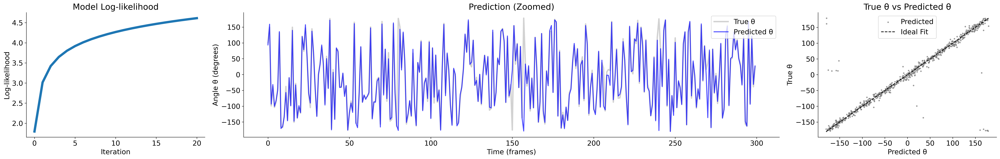

In [55]:
tscv = TimeSeriesSplit(n_splits=5) #here use timeseriessplit for cv (time respecting cv, but can adapt to carsen method too) 

# set the best alpha
best_alpha = 1.0  # Based on previous selection

# Store results
crc_results = {}

for input_type, X in inputs_circ_reg.items():
    print(f"Running Circular Regression for input type: {input_type}")

    y = y_wrapped  # angles 

    # initialize model with best alpha
    model = CircularRegression(alpha=best_alpha, max_iter=20)
    
    # Store metrics
    crc_results[input_type] = {'RMSE': [], 'MSE': [], 'Pearson R': [], 
                               'Explained Var': [], 'R²': [], 'coefficients': []}

    # perform time series cross-validation
    for train_index, test_index in tscv.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Fit the model
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Compute evaluation metrics
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mse = mean_squared_error(y_test, y_pred)
        pearson_r, _ = pearsonr(y_test.flatten(), y_pred.flatten())
        explained_var = explained_variance_score(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        
        # Store metrics
        crc_results[input_type]['RMSE'].append(rmse)
        crc_results[input_type]['MSE'].append(mse)
        crc_results[input_type]['Pearson R'].append(pearson_r)
        crc_results[input_type]['Explained Var'].append(explained_var)
        crc_results[input_type]['R²'].append(r2)
        crc_results[input_type]['coefficients'].append(model.weights_)  # save coefficients (in circ regression the attribute of weights is weights not coef)
        
        log_likelihood = model.log_like_hist_

    # Print mean R² for each input type
    print(f"Input: {input_type}, Alpha: {best_alpha}, Mean R²: {np.mean(crc_results[input_type]['R²'])}")

    plot_circular_regression_results(y_test, y_pred, log_likelihood, save_path=save_dir/ f"circ_regression_{input_type}_angle_prediction.png")

# Save results
np.save(save_dir / 'circ_regression_metrics_best_alpha_.npy', crc_results, allow_pickle=True)

In [58]:
# extract weights for each input type
angle_weights = {input_type: np.array(crc_results[input_type]['coefficients']) for input_type in crc_results}
                 
for input_type, weights in angle_weights.items():
    print(f"Angle weights for {input_type}: {weights.shape}")

Angle weights for acts: (5, 23589, 2)


In [ ]:
split_index = 4  # last split (or take mean)
weights_split_4 = angle_weights['acts'][split_index]  # Shape: (23589, 2)
print(weights_split_4)

angle_weights = weights_split_4

[[-0.00189819  0.001228  ]
 [ 0.00475118 -0.00944567]
 [-0.00079132  0.00106208]
 ...
 [-0.00039775 -0.01166897]
 [-0.00380561 -0.00353503]
 [ 0.00067264 -0.00687088]]


# Shuffle control analysis for circular regression


In [85]:
def block_permutation(y, block_size):
    n = len(y)
    num_blocks = n // block_size
    
    # Create shuffled blocks
    shuffled_y = np.concatenate([y[i * block_size: (i + 1) * block_size] for i in range(num_blocks)])
    return shuffled_y

def shuffled_control_circular_regression(X, targets, alpha, num_iterations):
    """
    Performs shuffled control analysis for Circular Regression with random block permutation.
    """
    shuffled_metrics = {name: {'RMSE': [], 'MSE': [], 'Pearson R': [], 
                               'Explained Var': [], 'R²': [], 'weights': [], 'log_likelihood': []} 
                        for name in targets.keys()}
    
    for target_name, y in targets.items():
        for _ in range(num_iterations):

            #shuffle (random)
            rnd_y = np.random.permutation(y)

            #block_permutation(y, block_size=round(0.5 * len(y) / 10))  # Adjust block size as needed
    
            # initialize model
            model = CircularRegression(alpha=alpha, max_iter=20)

            # Pperform random train-test split (80% train, 20% test) here train test split 
            X_train, X_test, y_train, y_test = train_test_split(X, rnd_y, test_size=0.2, random_state=42)

            # reshape y_train and y_test to be column vectors
            y_train = y_train.reshape(-1, 1)
            y_test = y_test.reshape(-1, 1)

            # fit the model
            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

            # compute evaluation metrics
            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
            mse = mean_squared_error(y_test, y_pred)
            pearson_r, _ = pearsonr(y_test.flatten(), y_pred.flatten())
            explained_var = explained_variance_score(y_test, y_pred)
            r2 = r2_score(y_test, y_pred)

            shuffled_metrics[target_name]['RMSE'].append(rmse)
            shuffled_metrics[target_name]['MSE'].append(mse)
            shuffled_metrics[target_name]['Pearson R'].append(pearson_r)
            shuffled_metrics[target_name]['Explained Var'].append(explained_var)
            shuffled_metrics[target_name]['R²'].append(r2)
            shuffled_metrics[target_name]['weights'].append(model.weights_)
            shuffled_metrics[target_name]['log_likelihood'].append(model.log_like_hist_)

    return shuffled_metrics

In [ ]:
print(f"Shape of X: {X.shape}")
print(f"Length of angles (rnd_y): {len(angles)}")

Shape of X: (4598, 23589)
Length of angles (rnd_y): 4598


# Run shuffled control 

In [86]:
alpha=1.0
num_iterations = 2 #n_iters for shuffle model 
X= acts.T
targets = {
'angles' : angles
}

shuffled_metrics_circular_regression = shuffled_control_circular_regression(X, targets, alpha, num_iterations)
# np.save(save_dir / 'circ_regression_shuffled_metrics_all_inputs.npy', shuffled_metrics_circular_regression, allow_pickle=True)


In [68]:
# len(shuffled_metrics_circular_regression['angles']['weights'][0]) # shape n_neurons 

# Compare real - shuffled circular regression models

In [87]:
shuffled_metrics_crc_reg = np.load(save_dir/'circ_regression_shuffled_metrics_all_inputs.npy', allow_pickle=True).item()
real_metrics_crc_reg = np.load(save_dir/'circ_regression_metrics_best_alpha.npy', allow_pickle=True).item() 

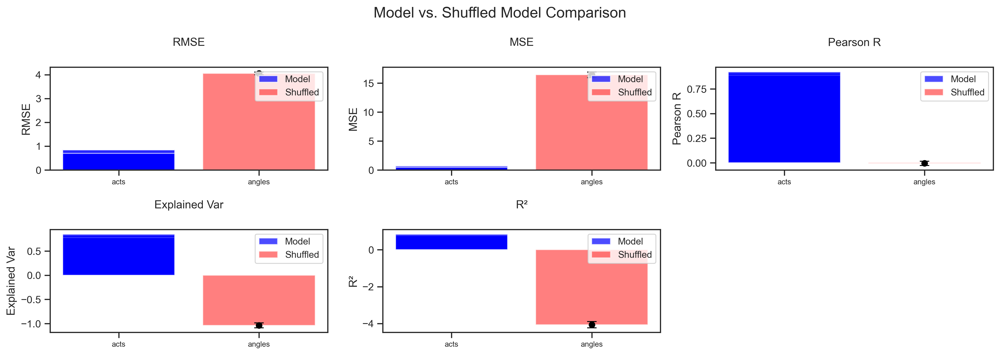

In [88]:
def compare_real_vs_shuffled(metrics, shuffled_metrics, target, shuffled_target, num_iterations, save_dir):
    """
    Plots real vs shuffled model performance.
    """
    metrics_labels = ['RMSE', 'MSE', 'Pearson R', 'Explained Var', 'R²']
    plt.figure(figsize=(15, 5), dpi=300)
    
    for i, metric in enumerate(metrics_labels):
        plt.subplot(2, 3, i + 1)
        
        # Access metrics for the specified target
        real_values = metrics[target][metric]  # Access metrics for 'acts'
        shuffled_values = np.mean(shuffled_metrics[shuffled_target][metric])  # Mean of shuffled metrics for 'angles'
        shuffled_sem = np.std(shuffled_metrics[shuffled_target][metric]) / np.sqrt(num_iterations)  # Standard error

        plt.bar(0, real_values, color='blue', alpha=0.7, label="Model")
        plt.bar(1, shuffled_values, color='red', alpha=0.5, label="Shuffled")
        plt.errorbar(1, shuffled_values, yerr=shuffled_sem, fmt='o', color='black', capsize=5)
        
        plt.xticks([0, 1], [target, shuffled_target], fontsize=8)
        plt.ylabel(metric)
        plt.title(f"{metric}", y=1.15)
        plt.legend(loc='upper right', fontsize=10)
    
    plt.tight_layout()
    plt.suptitle("Model vs. Shuffled Model Comparison", fontsize=16, y=1.05)
    plt.savefig(save_dir / 'circ_ridge_all_vars_regression_real_vs_shuffled.png')
    plt.savefig(save_dir / 'circ_ridge_all_vars_regression_real_vs_shuffled.svg', dpi=300)

    plt.show()

# Now call the function for the 'acts' target comparing it with shuffled 'angles'
compare_real_vs_shuffled(real_metrics_crc_reg, shuffled_metrics_crc_reg, 'acts', 'angles', num_iterations, save_dir)


In [89]:
real_metrics_crc_reg = crc_results  # acts and select all metrices for angles
shuffled_metrics_crc_reg = shuffled_metrics_circular_regression # using only acts as input, select all shuffled metrices for angles 

# Adding angles to mixed-selectivity analysis

In [90]:
speed_shuffled_weights = np.mean(shuffled_regression_results_single_inputs['speed']['weights'], axis=0)#for each iteration
speed_real_weights = ridge_regression_results_single_inputs['speed']['weights'] 

acceleration_shuffled_weights = np.mean(shuffled_regression_results_single_inputs['acceleration']['weights'], axis=0)#for each iteration
acceleration_real_weights = ridge_regression_results_single_inputs['acceleration']['weights'] 

In [ ]:
# circ_reg_acts = crc_results['acts']
# len(circ_reg_acts['coefficients']) #len equals no. of tests 
# circ_reg_acts_weights = circ_reg_acts['coefficients']

In [ ]:
# get real angle weights
weights = np.array(weights_split_4)

sin_weights = np.array(weights)[:, 0]  # sin components
cos_weights = np.array(weights)[:, 1]  # cos components
real_angle_weights = np.sqrt(sin_weights**2 + cos_weights**2)

# Spearman pair scatter plots - all weights (including angles)

Pairplot for Real Weights


TypeError: Figure.savefig() takes 2 positional arguments but 3 were given

<Figure size 6000x1200 with 0 Axes>

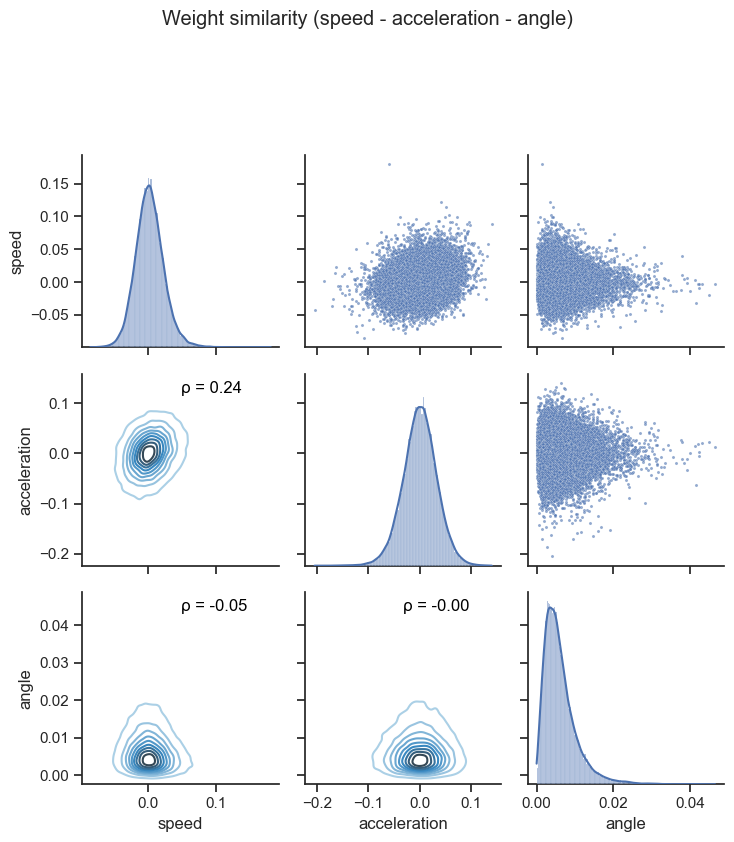

In [91]:
# Create a DataFrame for real weights
real_weights_df = pd.DataFrame({
    'speed': speed_real_weights,
    'acceleration': acceleration_real_weights,
    'angle': real_angle_weights  # Add the circular regression weights here
})

# Function to add Spearman correlation to the plots
def plot_spearman_corr(x, y, **kwargs):
    corr, _ = spearmanr(x, y)
    ax = plt.gca()
    ax.annotate(f'ρ = {corr:.2f}', xy=(0.5, 0.9), xycoords=ax.transAxes, fontsize=12, color='black')

# Plot pairplots for real weights
print("Pairplot for Real Weights")
sns.set(style="ticks")
plt.figure(dpi=300)

# Create the PairGrid
g = sns.PairGrid(real_weights_df)
g.map_upper(sns.scatterplot, alpha=0.6, s=5)  # Scatter plots in the upper triangle
g.map_lower(sns.kdeplot, cmap="Blues_d")  # KDE plots in the lower triangle
g.map_diag(sns.histplot, kde=True)  # Histograms on the diagonal
g.map_lower(plot_spearman_corr)  # Add Spearman correlation to the lower triangle

# Add a title
g.fig.suptitle("Weight similarity (speed - acceleration - angle)", y=1.12)

# Save the plot
plt.tight_layout()
plt.savefig(save_dir, 'spearman_ridge_all_vars.png')  # Save the figure
plt.savefig(save_dir, 'spearman_ridge_all_vars.svg')  # Save the figure


# Define sin and cosine and combo weights of angles (shuffled)

In [93]:
shuffled_circ_weights =  np.array(shuffled_metrics_crc_reg['angles']['weights']) 
shuffled_circ_weights[0].shape

(23589, 2)

keep for one iter the sin and cosine 

In [96]:
shuffled_weights = shuffled_circ_weights[0]
#average_weights_per_iter = np.array([np.mean(weights, axis=1) for weights in shuffled_circ_weights]) #here i only hve 20-80 train test a
print(shuffled_weights.shape)


(23589, 2)


In [95]:
# average_weights_split_last = average_weights_per_split[-1]
sin_weights_shuffle = shuffled_weights[:, 0]  # sin components
cos_weights_shuffle = shuffled_weights[:, 1]  # cos components


shuffle_angle_weights = np.sqrt(sin_weights_shuffle**2 + cos_weights_shuffle**2) # combine sin and cosine weights

# # Mixed-selectivity (Visualisation-Venn plots) (including angles to compare with rate and state variable)

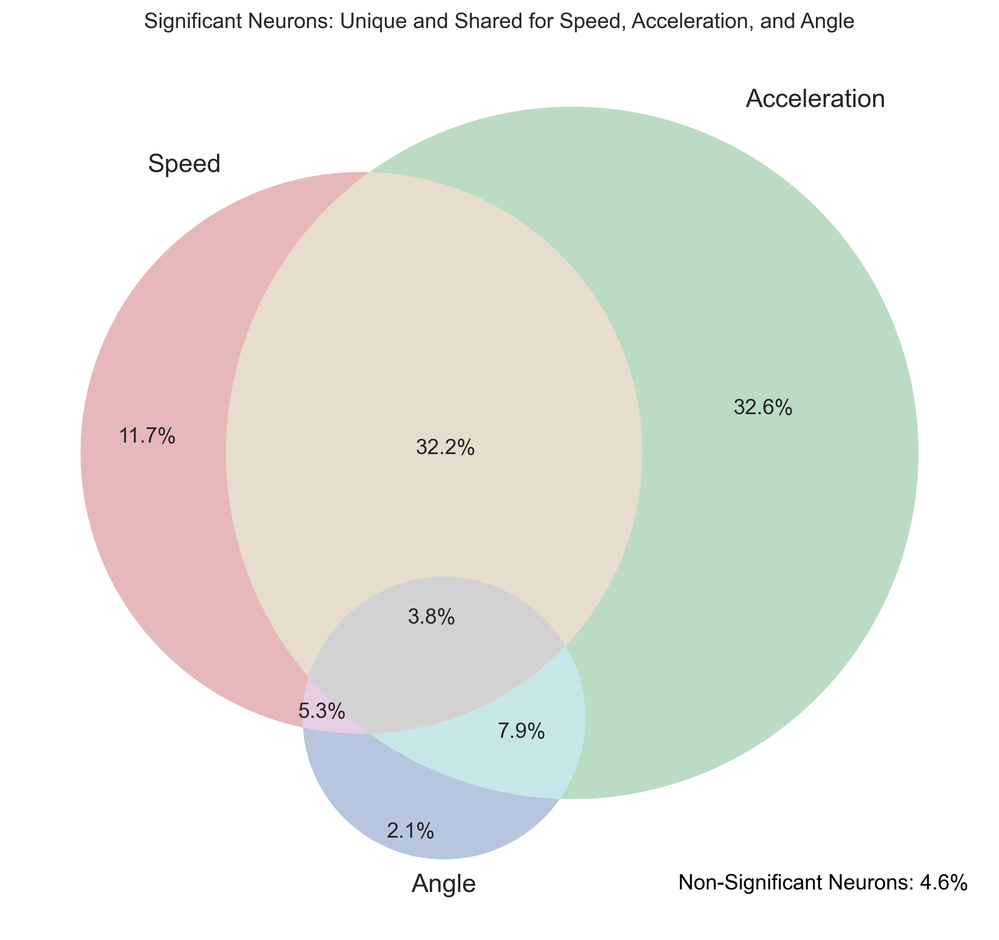

In [ ]:
# Get angle weights
angle_significant_inds = get_significant_weights(real_angle_weights,shuffle_angle_weights) #real_angle_weightsCAREFUL/ also take sin cosine here ! 

angle_set = set(angle_significant_inds)
speed_set = set(speed_significant_indices)
acceleration_set = set(acceleration_significant_indices)

# compute unique/shared counts for significant neurons
only_speed = len(speed_set - acceleration_set - angle_set)
only_acceleration = len(acceleration_set - speed_set - angle_set)
only_angle = len(angle_set - speed_set - acceleration_set)
shared_speed_acceleration = len(speed_set & acceleration_set)
shared_speed_angle = len(speed_set & angle_set)
shared_acceleration_angle = len(acceleration_set & angle_set)
shared_all = len(speed_set & acceleration_set & angle_set)

total_neurons = n_neurons #all neurons imaged 

# compute percentages 
only_speed_pct = (only_speed / total_neurons) * 100
only_acceleration_pct = (only_acceleration / total_neurons) * 100
only_angle_pct = (only_angle / total_neurons) * 100
shared_speed_acceleration_pct = (shared_speed_acceleration / total_neurons) * 100
shared_speed_angle_pct = (shared_speed_angle / total_neurons) * 100
shared_acceleration_angle_pct = (shared_acceleration_angle / total_neurons) * 100
shared_all_pct = (shared_all / total_neurons) * 100

# inside all
inside_percentage = (only_speed_pct + only_acceleration_pct + only_angle_pct +
                     shared_speed_acceleration_pct + shared_speed_angle_pct +
                     shared_acceleration_angle_pct + shared_all_pct)

# outside (non-sig)
non_significant_pct = 100 - inside_percentage  # Ensure the total is 100%

# if non_significant_pct is negative, we have a problem with the inside percentages
if non_significant_pct < 0:
    print(f"Warning: The inside percentages sum to more than 100%. Check for over-counting.")
    non_significant_pct = 0  # Set it to 0 or a reasonable value

# Plot Venn Diagram for significant neurons
plt.figure(figsize=(8, 8), dpi=300)
venn = venn3([speed_set, acceleration_set, angle_set], ('Speed', 'Acceleration', 'Angle'))

# Update labels with percentages for significant neurons
if venn.get_label_by_id('100'):
    venn.get_label_by_id('100').set_text(f"{only_speed_pct:.1f}%")
if venn.get_label_by_id('010'):
    venn.get_label_by_id('010').set_text(f"{only_acceleration_pct:.1f}%")
if venn.get_label_by_id('001'):
    venn.get_label_by_id('001').set_text(f"{only_angle_pct:.1f}%")
if venn.get_label_by_id('110'):
    venn.get_label_by_id('110').set_text(f"{shared_speed_acceleration_pct:.1f}%")
if venn.get_label_by_id('101'):
    venn.get_label_by_id('101').set_text(f"{shared_speed_angle_pct:.1f}%")
if venn.get_label_by_id('011'):
    venn.get_label_by_id('011').set_text(f"{shared_acceleration_angle_pct:.1f}%")
if venn.get_label_by_id('111'):
    venn.get_label_by_id('111').set_text(f"{shared_all_pct:.1f}%")

# Add label for non-significant neurons outside the Venn diagram
plt.text(0.5, -0.6, f"Non-Significant Neurons: {non_significant_pct:.1f}%", ha='center', va='center', fontsize=12, color='black')

# Add title and save the plot
plt.title("Significant Neurons: Unique and Shared for Speed, Acceleration, and Angle")
plt.savefig(save_dir / 'all_vars_evoked_venn_plot_significant_neurons_all_vars.png')
plt.savefig(save_dir / 'all_vars_evoked__venn_plot_significant_neurons_all_vars.svg')

plt.show()




# Multi-inputs Circular regression to compare r² along inputs

In [102]:
inputs = {
'acts' : acts.T, #z-scored acts, shape: time, neurons 
'PCs': eigenvalues_t_95_var.T, # PCs, shape: time, PCs
'temporal_nmfs': H.T, # temporal component of NMF, shape: time, NMFs 
}

targets = {
'angles' : angles
}


Running Circular Regression for input type: acts
Input: acts, Alpha: 1.0, Mean R²: 0.815711748508652


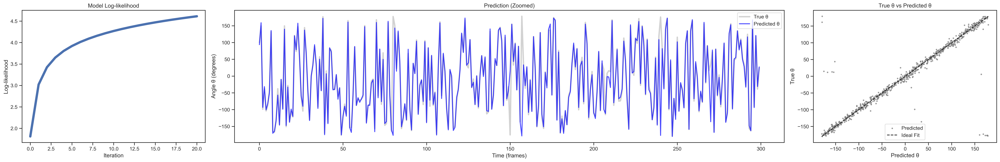

KeyError: 'PCs'

<Figure size 900x900 with 0 Axes>

In [103]:
tscv = TimeSeriesSplit(n_splits=5) #here use timeseriessplit for cv (time respecting cv, but can adapt to carsen method too) 

# set the best alpha
best_alpha = 1.0  # Based on previous selection

# Store results
crc_results = {}

for input_type, X in inputs_circ_reg.items():
    print(f"Running Circular Regression for input type: {input_type}")

    y = y_wrapped  # angles 

    # initialize model with best alpha
    model = CircularRegression(alpha=best_alpha, max_iter=20)
    
    # Store metrics
    crc_results[input_type] = {'RMSE': [], 'MSE': [], 'Pearson R': [], 
                               'Explained Var': [], 'R²': [], 'coefficients': []}

    # perform time series cross-validation
    for train_index, test_index in tscv.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Fit the model
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Compute evaluation metrics
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mse = mean_squared_error(y_test, y_pred)
        pearson_r, _ = pearsonr(y_test.flatten(), y_pred.flatten())
        explained_var = explained_variance_score(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        
        # Store metrics
        crc_results[input_type]['RMSE'].append(rmse)
        crc_results[input_type]['MSE'].append(mse)
        crc_results[input_type]['Pearson R'].append(pearson_r)
        crc_results[input_type]['Explained Var'].append(explained_var)
        crc_results[input_type]['R²'].append(r2)
        crc_results[input_type]['coefficients'].append(model.weights_)  # save coefficients (in circ regression the attribute of weights is weights not coef)
        
        log_likelihood = model.log_like_hist_

    # Print mean R² for each input type
    print(f"Input: {input_type}, Alpha: {best_alpha}, Mean R²: {np.mean(crc_results[input_type]['R²'])}")

    plot_circular_regression_results(y_test, y_pred, log_likelihood, save_path=save_dir/ f"circ_regression_{input_type}_angle_prediction.png")

# Save results
np.save(save_dir / 'circ_regression_metrics_best_alpha_all_inputs_.npy', crc_results, allow_pickle=True)


plot_r2_comparison_circ(crc_results, save_dir=save_dir, include_pcs=False) #save and compare for all inputs --> angles 
plot_r2_comparison_circ(crc_results, save_dir=save_dir, include_pcs=True)

<!-- Spearman -->

In [ ]:
'''save all vars'''

# outputs_dict = {
#     "speed": speed,
#     "acceleration":acceleration,
#     "angles": angles, 
#     "delta_theta": delta_theta,
#     "ratios": ratios,
#     "log_ratios": log_ratios,
#     "NMF_W_neuron_matrix": W, #shape neurons, n_comps 
#     "NMF_H_time_matrix" : H, #shape n_comps, time 
#     'vonmises_pdf': vonmises_pdf #for all n_neurons
# }


# save_dir = r'C:\Users\zaggila\Desktop\NMA'
# file_path = os.path.join(save_dir, "outputs_dict.npy")
# np.save(file_path, outputs_dict)
# np.save(save_dir + "outputs_dict.npy", outputs_dict)